# Importing Libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

### Reading the Dataset in a Dataframe

In [4]:
movies_df = pd.read_csv("movies_utf8.csv")
movies_df.head()

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy


In [5]:
rating_df = pd.read_csv("rating_utf8.csv")
rating_df.head()

,userId,movieId,rating,timestamp
0,12882,1,4.0,1147195252
1,12882,32,3.5,1147195307
2,12882,47,5.0,1147195343
3,12882,50,5.0,1147185499
4,12882,110,4.5,1147195239


In [6]:
tags_df = pd.read_csv("tags_utf8.csv")
tags_df.head()

,movieId,userId,tag,timestamp
0,3916,12882,sports,1147195545
1,4085,12882,Eddie Murphy,1147195966
2,33660,12882,boxing,1147195514
3,1197,320,must show,1145964801
4,1396,320,must show,1145964810


### Merge 1: Combine movie dataset with ratings


In [8]:
movies_rating_df = pd.merge(
    left=movies_df,
    right=rating_df,
    on="movieId",
    how="inner"
)
movies_rating_df

,movieId,title,genres,userId,rating,timestamp
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,12882,4.0,1147195252
1,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,121987,4.5,1308152264
2,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,18127,4.0,1130946329
3,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,17318,4.0,1168807334
4,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,69519,4.0,1303980621
...,...,...,...,...,...,...
264500,112852,Guardians of the Galaxy (2014),Action|Adventure|Sci-Fi,26867,2.5,1418789842
264501,112852,Guardians of the Galaxy (2014),Action|Adventure|Sci-Fi,86768,4.0,1426475869
264502,112852,Guardians of the Galaxy (2014),Action|Adventure|Sci-Fi,39214,4.0,1416110586
264503,112852,Guardians of the Galaxy (2014),Action|Adventure|Sci-Fi,102118,4.0,1416756118


#### Renaming the timestamp

In [10]:
movies_rating_df.rename(columns={"timestamp": "rating_timestamp"}, inplace=True)


In [11]:
movies_rating_df.head()

,movieId,title,genres,userId,rating,rating_timestamp
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,12882,4.0,1147195252
1,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,121987,4.5,1308152264
2,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,18127,4.0,1130946329
3,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,17318,4.0,1168807334
4,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,69519,4.0,1303980621


### Merge 2: Add tag information for the same movie and user


In [13]:
movie_rating_tags_df = pd.merge(
    left=movies_rating_df,
    right=tags_df,
    on=["movieId", "userId"],
    how="inner"
)
movie_rating_tags_df

,movieId,title,genres,userId,rating,rating_timestamp,tag,timestamp
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,108922,0.5,1284588846,children,1284588869
1,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,108922,0.5,1284588846,computer animation,1284588868
2,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,108922,0.5,1284588846,Disney,1284588860
3,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,108922,0.5,1284588846,family,1284588873
4,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,108922,0.5,1284588846,Pixar,1284588865
...,...,...,...,...,...,...,...,...
81807,112852,Guardians of the Galaxy (2014),Action|Adventure|Sci-Fi,88738,4.0,1416086278,Marvel,1416086401
81808,112852,Guardians of the Galaxy (2014),Action|Adventure|Sci-Fi,88738,4.0,1416086278,space,1416086288
81809,112852,Guardians of the Galaxy (2014),Action|Adventure|Sci-Fi,88738,4.0,1416086278,talking animals,1416086285
81810,112852,Guardians of the Galaxy (2014),Action|Adventure|Sci-Fi,88738,4.0,1416086278,watch the credits,1416086391


### Renaming the columns timestamp

In [15]:
movie_rating_tags_df.rename(columns={"timestamp": "tag_timestamp"}, inplace=True)


In [16]:
movie_rating_tags_df

,movieId,title,genres,userId,rating,rating_timestamp,tag,tag_timestamp
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,108922,0.5,1284588846,children,1284588869
1,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,108922,0.5,1284588846,computer animation,1284588868
2,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,108922,0.5,1284588846,Disney,1284588860
3,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,108922,0.5,1284588846,family,1284588873
4,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,108922,0.5,1284588846,Pixar,1284588865
...,...,...,...,...,...,...,...,...
81807,112852,Guardians of the Galaxy (2014),Action|Adventure|Sci-Fi,88738,4.0,1416086278,Marvel,1416086401
81808,112852,Guardians of the Galaxy (2014),Action|Adventure|Sci-Fi,88738,4.0,1416086278,space,1416086288
81809,112852,Guardians of the Galaxy (2014),Action|Adventure|Sci-Fi,88738,4.0,1416086278,talking animals,1416086285
81810,112852,Guardians of the Galaxy (2014),Action|Adventure|Sci-Fi,88738,4.0,1416086278,watch the credits,1416086391


### Descriptive statistics

In [18]:
movie_rating_tags_df.describe(include="all")

,movieId,title,genres,userId,rating,rating_timestamp,tag,tag_timestamp
count,81812.000000,81812,81812,81812.000000,81812.000000,8.181200e+04,81812,8.181200e+04
unique,NaN,2453,509,NaN,NaN,NaN,12286,NaN
top,NaN,Pulp Fiction (1994),Drama,NaN,NaN,NaN,atmospheric,NaN
freq,NaN,503,4759,NaN,NaN,NaN,589,NaN
mean,18486.150662,NaN,NaN,69357.338679,3.708912,1.251025e+09,NaN,1.275693e+09
std,27826.689490,NaN,NaN,42336.813806,1.051274,1.110134e+08,NaN,7.842651e+07
min,1.000000,NaN,NaN,316.000000,0.500000,8.768953e+08,NaN,1.136772e+09
25%,1300.000000,NaN,NaN,27898.000000,3.000000,1.184772e+09,NaN,1.217731e+09
50%,3624.000000,NaN,NaN,68558.000000,4.000000,1.267616e+09,NaN,1.278599e+09
75%,32587.000000,NaN,NaN,108442.000000,4.500000,1.334419e+09,NaN,1.334605e+09


The dataset contains 81,812 rows with no missing values. Both movieId and userId are currently stored as integers but should be treated as unique identifiers, and thus converted to categorical or string types. There are 2,453 unique movie titles, with Pulp Fiction (1994) appearing most frequently (503 times). The genres column includes 509 unique combinations, as multiple genres are combined into single strings using the "|" delimiter; this should be split into individual genres for proper analysis. The rating column ranges from 0.5 to 5, with a mean of 3.7089, and shows a roughly symmetric distribution slightly skewed by lower outliers. The timestamp field, stored as a Unix timestamp, needs to be converted to datetime format. Lastly, the tag column contains 12,286 unique values, with "atmospheric" being the most common tag, appearing 589 times.


### Changing the timestamp to datatime format
The unit='s' parameter in pd.to_datetime(..., unit='s') tells pandas that the timestamp values are in seconds since the Unix epoch (i.e., since January 1, 1970).

Unix timestamps are often stored as large integers like 1147195252, which represent the number of seconds since 1970-01-01 00:00:00 UTC. Pandas needs to know what time unit to correctly convert these numbers into datetime.

In [21]:
movie_rating_tags_df['rating_timestamp'] = pd.to_datetime(movie_rating_tags_df['rating_timestamp'], unit='s')
movie_rating_tags_df['tag_timestamp'] = pd.to_datetime(movie_rating_tags_df['tag_timestamp'], unit='s')
movie_rating_tags_df

,movieId,title,genres,userId,rating,rating_timestamp,tag,tag_timestamp
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,108922,0.5,2010-09-15 22:14:06,children,2010-09-15 22:14:29
1,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,108922,0.5,2010-09-15 22:14:06,computer animation,2010-09-15 22:14:28
2,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,108922,0.5,2010-09-15 22:14:06,Disney,2010-09-15 22:14:20
3,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,108922,0.5,2010-09-15 22:14:06,family,2010-09-15 22:14:33
4,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,108922,0.5,2010-09-15 22:14:06,Pixar,2010-09-15 22:14:25
...,...,...,...,...,...,...,...,...
81807,112852,Guardians of the Galaxy (2014),Action|Adventure|Sci-Fi,88738,4.0,2014-11-15 21:17:58,Marvel,2014-11-15 21:20:01
81808,112852,Guardians of the Galaxy (2014),Action|Adventure|Sci-Fi,88738,4.0,2014-11-15 21:17:58,space,2014-11-15 21:18:08
81809,112852,Guardians of the Galaxy (2014),Action|Adventure|Sci-Fi,88738,4.0,2014-11-15 21:17:58,talking animals,2014-11-15 21:18:05
81810,112852,Guardians of the Galaxy (2014),Action|Adventure|Sci-Fi,88738,4.0,2014-11-15 21:17:58,watch the credits,2014-11-15 21:19:51


#### Convert movieId and userId to categorical data types


In [23]:
movie_rating_tags_df['movieId'] = movie_rating_tags_df['movieId'].astype('category')
movie_rating_tags_df['userId'] = movie_rating_tags_df['userId'].astype('category')


In [24]:
movie_rating_tags_df.describe(include="all")

,movieId,title,genres,userId,rating,rating_timestamp,tag,tag_timestamp
count,81812.0,81812,81812,81812.0,81812.000000,81812,81812,81812
unique,2453.0,2453,509,808.0,NaN,NaN,12286,NaN
top,296.0,Pulp Fiction (1994),Drama,58612.0,NaN,NaN,atmospheric,NaN
freq,503.0,503,4759,5886.0,NaN,NaN,589,NaN
mean,NaN,NaN,NaN,NaN,3.708912,2009-08-23 11:03:21.853884416,NaN,2010-06-04 23:04:18.906419456
min,NaN,NaN,NaN,NaN,0.500000,1997-10-15 06:01:46,NaN,2006-01-09 02:01:59
25%,NaN,NaN,NaN,NaN,3.000000,2007-07-18 15:11:46,NaN,2008-08-03 02:32:49.500000
50%,NaN,NaN,NaN,NaN,4.000000,2010-03-03 11:32:26,NaN,2010-07-08 14:18:02.500000
75%,NaN,NaN,NaN,NaN,4.500000,2012-04-14 16:04:30,NaN,2012-04-16 19:29:21.249999872
max,NaN,NaN,NaN,NaN,5.000000,2015-03-30 18:33:54,NaN,2015-03-30 20:05:34


Unique Movies: There are 2,453 unique movies (movieId), and the most frequent movie, Pulp Fiction (1994), appears 503 times in the dataset.

Unique Users: There are 808 unique users (userId), with one user (ID: 58612) having the highest number of ratings (5,886 times).

Rating Distribution: The ratings follow a typical distribution, with a mean of 3.71, skewed slightly towards the lower values (given that the minimum rating is 0.5).

Timestamps: The timestamps have been converted into datetime format successfully, showing values ranging from the earliest (October 15, 1997) to the latest (March 30, 2015).

Tags: There are 12,286 unique tags in the dataset, with the tag atmospheric being the most frequently mentioned (589 times).

#### Checking the datatype

In [27]:
movie_rating_tags_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81812 entries, 0 to 81811
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   movieId           81812 non-null  category      
 1   title             81812 non-null  object        
 2   genres            81812 non-null  object        
 3   userId            81812 non-null  category      
 4   rating            81812 non-null  float64       
 5   rating_timestamp  81812 non-null  datetime64[ns]
 6   tag               81812 non-null  object        
 7   tag_timestamp     81812 non-null  datetime64[ns]
dtypes: category(2), datetime64[ns](2), float64(1), object(3)
memory usage: 4.2+ MB


#### Checking for duplicates

In [29]:
movie_rating_tags_df.duplicated().sum()

0

#### Checking for null values

In [31]:
movie_rating_tags_df.isnull().sum()

movieId             0
title               0
genres              0
userId              0
rating              0
rating_timestamp    0
tag                 0
tag_timestamp       0
dtype: int64

There are no missing values. 
## Next Step: Splitting the genres

### Preprocessing Steps for Clustering
To prepare the movies dataframe for clustering, it's essential to convert the genres column into a suitable numerical format. Since the genres column is categorical and multi-label—where a single movie can belong to multiple genres—it needs to be transformed into a binary vector using one-hot encoding. This involves creating a separate column for each unique genre and assigning a value of 1 if a movie belongs to that genre, and 0 otherwise. This transformation is critical because clustering algorithms such as KMeans, DBSCAN, or Hierarchical Clustering require numerical input to calculate distances and similarities between data points. If the genres are left as raw text strings, the algorithms will fail to interpret the categorical structure, leading to inaccurate or meaningless clusters. By converting genres into a one-hot encoded format, each movie is represented as a point in a high-dimensional genre space, allowing the algorithms to group movies based on similar genre combinations effectively.

### Finding the unique values in the Genre of the movies dataset

In [35]:
unique_genres = set(g for genre_list in movie_rating_tags_df["genres"].str.split('|') for g in genre_list)
print(unique_genres)

{'Action', 'Children', 'Sci-Fi', 'Thriller', 'Drama', 'Mystery', 'Documentary', 'War', 'Musical', 'Comedy', 'Fantasy', 'IMAX', 'Romance', 'Adventure', 'Film-Noir', 'Horror', 'Crime', 'Western', 'Animation'}


### MultiLabelBinarizer for one hot encoding the Genre column in movies dataset
To prepare the genres column for machine learning tasks such as clustering, recommendation systems, or other predictive models, it's important to convert the multi-label genre data into a numerical format. Since each movie can belong to multiple genres, we treat each genre as a separate binary feature, where a value of 1 indicates the presence of that genre and 0 indicates its absence. This is efficiently achieved using MultiLabelBinarizer from sklearn.preprocessing, which transforms a list of genre labels into a one-hot encoded format. This transformation allows ML algorithms to interpret the genre structure mathematically, enabling them to compute distances, identify patterns, and make predictions based on genre combinations. Without this step, models would be unable to process or learn from the textual genre data.

In [37]:
from sklearn.preprocessing import MultiLabelBinarizer

movie_rating_tags_df['genres'] = movie_rating_tags_df['genres'].apply(lambda x: x.split('|'))
mlb = MultiLabelBinarizer()
binary_genres = mlb.fit_transform(movie_rating_tags_df["genres"])
genres_encoded = pd.DataFrame(binary_genres, columns=mlb.classes_, index=movie_rating_tags_df.index)
movie_rating_tags_df = pd.concat([movie_rating_tags_df, genres_encoded], axis=1)
#movie_rating_tags_df = movie_rating_tags_df.drop(["genres"], axis=1)

In [38]:
pd.set_option("display.max_columns", None)

movie_rating_tags_df

,movieId,title,genres,userId,rating,rating_timestamp,tag,tag_timestamp,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
0,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,children,2010-09-15 22:14:29,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,computer animation,2010-09-15 22:14:28,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,Disney,2010-09-15 22:14:20,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,family,2010-09-15 22:14:33,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,Pixar,2010-09-15 22:14:25,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81807,112852,Guardians of the Galaxy (2014),"[Action, Adventure, Sci-Fi]",88738,4.0,2014-11-15 21:17:58,Marvel,2014-11-15 21:20:01,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
81808,112852,Guardians of the Galaxy (2014),"[Action, Adventure, Sci-Fi]",88738,4.0,2014-11-15 21:17:58,space,2014-11-15 21:18:08,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
81809,112852,Guardians of the Galaxy (2014),"[Action, Adventure, Sci-Fi]",88738,4.0,2014-11-15 21:17:58,talking animals,2014-11-15 21:18:05,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
81810,112852,Guardians of the Galaxy (2014),"[Action, Adventure, Sci-Fi]",88738,4.0,2014-11-15 21:17:58,watch the credits,2014-11-15 21:19:51,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


# Data Visualisations: Univariate analysis
### Distribution of userId

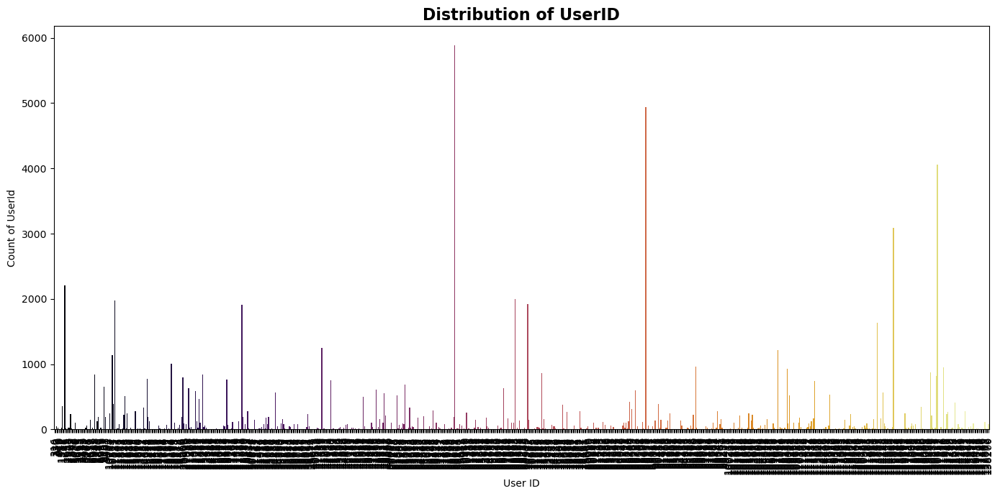

In [40]:


# Set up the figure
plt.figure(figsize=(14, 7))

# Plot user activity
sns.countplot(data=movie_rating_tags_df, x="userId", palette="inferno")

# Rotate labels for clarity
plt.xticks(rotation=90)

# Labels and title
plt.title('Distribution of UserID', fontsize=16, weight="bold")
plt.xlabel("User ID")
plt.ylabel("Count of UserId")

# Improve layout
plt.tight_layout()
plt.show()

The user rating distribution shows a clear long-tail pattern. Only a small group of users have contributed a high number of ratings, while the majority have rated very few movies — possibly just the default or minimum number (like a single rating). This skew indicates that most of the dataset's richness comes from a small, active subset of users.

### Title analysis:

In [42]:
title_counts = movie_rating_tags_df["title"].value_counts().sort_values(ascending=False).head(30)
title_counts=title_counts.reset_index()
title_counts

,title,count
0,Pulp Fiction (1994),503
1,Fight Club (1999),385
2,Inception (2010),342
3,"Shawshank Redemption, The (1994)",292
4,"Matrix, The (1999)",289
5,Inglourious Basterds (2009),275
6,"Silence of the Lambs, The (1991)",274
7,"Amelie (Fabuleux destin d'Amélie Poulain, Le) ...",251
8,Donnie Darko (2001),250
9,Memento (2000),249


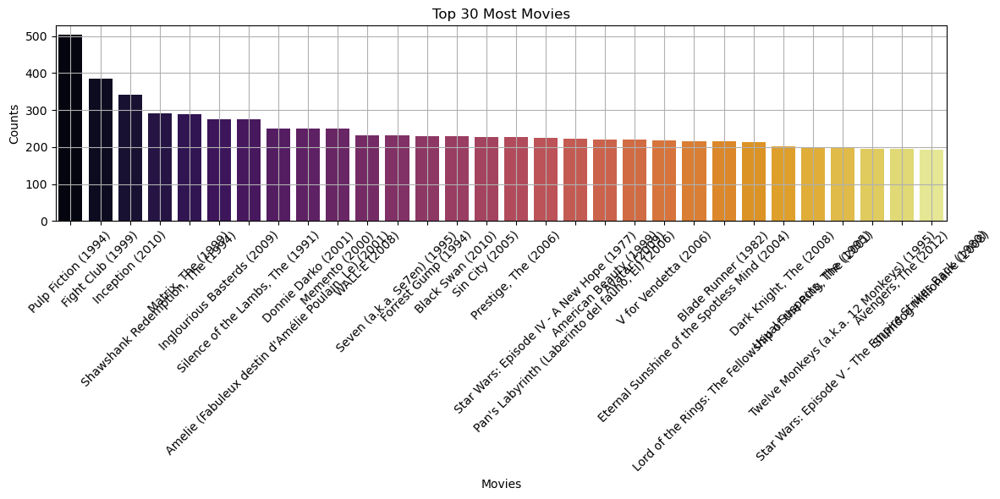

In [43]:

plt.figure(figsize=(12, 6))
sns.barplot(data=title_counts,x = "title", y="count", palette='inferno')
plt.title('Top 30 Most Movies')
plt.xticks(rotation=45)
plt.xlabel('Movies')
plt.ylabel('Counts')
plt.grid(True)
plt.tight_layout()
plt.show()

In the top 30 most frequent movies, a few titles dominate the dataset. Pulp Fiction leads with ~500 ratings, followed by Fight Club, Inception, and The Shawshank Redemption, each receiving 300+ ratings. The remaining movies in the top 30 typically received between 200–300 ratings. It also indicates long-term popularity or rewatch value, especially since users actively engage with them post-viewing. These titles might bias recommendation systems if not normalized, due to their high representation.

### Rating Analysis:

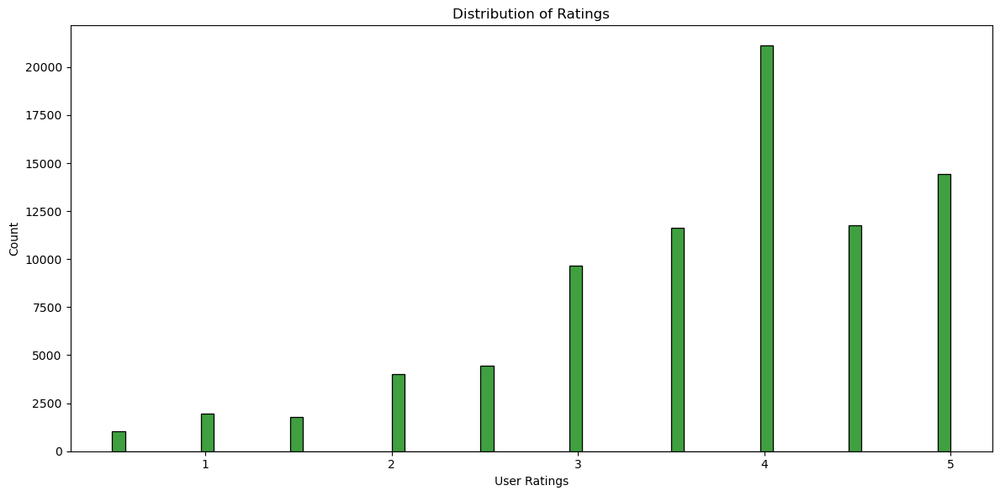

In [45]:
# Set up the figure size
plt.figure(figsize=(12, 6))

sns.histplot(data=movie_rating_tags_df, x="rating", color="green")
plt.title('Distribution of Ratings')
plt.xlabel("User Ratings")

# Adjust layout to prevent overlap
plt.tight_layout()

plt.show()

It can be seen that Users have rated 4 many times followed by 5. Ratings are showing an increased figures from 3 and there is a skewness towards the lower end of 0.5, 1, 1.5,2, 2.5. The Peak at 4 and 5 shows most users rate movies positively, often 4 or 5 stars. This could reflect either a general tendency to only watch movies they expect to enjoy, or positivity bias in rating behavior. Fewer low ratings (0.5 to 2.5) shows users may avoid rating poorly or stop watching bad movies before rating them. Systems may discourage harsh ratings (intentionally or not). Steady rise from 3 → 5 shows that the average is 3.7 and left skew in user satisfaction.

### Top 40 most common tags


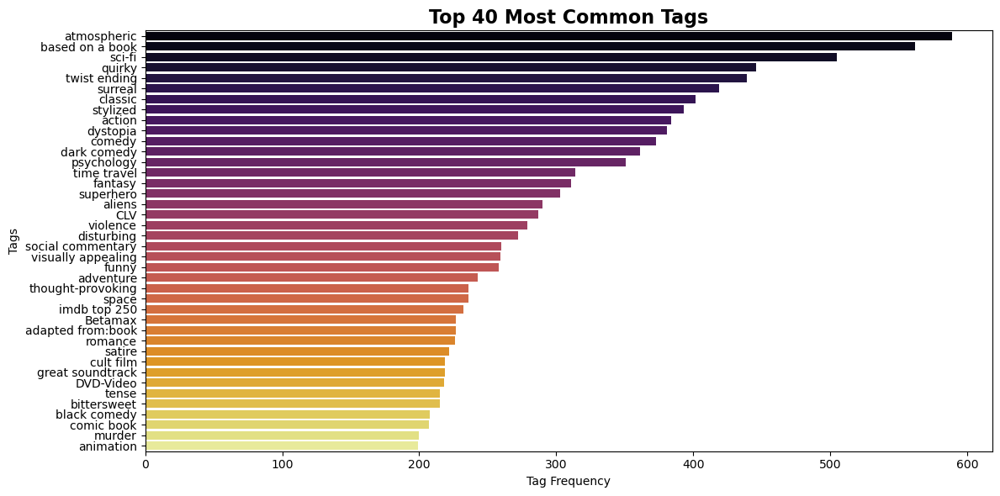

In [47]:

top_tags = movie_rating_tags_df['tag'].value_counts().head(40)

plt.figure(figsize=(12, 6))
sns.barplot(x=top_tags.values, y=top_tags.index, palette='inferno')
plt.title('Top 40 Most Common Tags', fontsize=16, weight="bold")
plt.xlabel('Tag Frequency')
plt.ylabel('Tags')
plt.tight_layout()
plt.show()

Among the top 40 most frequent tags, "atmospheric" appears most often (600 times), followed by "based on a book" (550) and "sci-fi" (500). The various names of the tags suggests that viewers often describe movies by mood, source material, and genre-related keywords, reflecting how they interpret or categorize content. Tags like these can enhance content discovery and recommendation systems. They reflect user perception, not just metadata — e.g., viewers feel a movie is "atmospheric" even if that’s not a listed genre. Frequent tags can help build clusters of similarly tagged movies, useful for user profiling or filtering.

### BiVariate analysis - Movie vs rating analysis


Helps identify well-rated and popular movies. 
### Creating a Movie vs rating - mean and count columns

In [51]:
movie_stats = movie_rating_tags_df.groupby('movieId')['rating'].agg(['mean', 'count'])
movie_stats

,mean,count
movieId,,
1,3.950980,102
2,3.138298,47
3,3.166667,6
4,3.250000,4
5,3.277778,9
...,...,...
109487,4.292208,77
111362,3.750000,38
111759,3.750000,28


In [52]:
movie_rating_tags_df = pd.merge(movie_rating_tags_df, movie_stats, on='movieId', how='left')
movie_rating_tags_df.head()

,movieId,title,genres,userId,rating,rating_timestamp,tag,tag_timestamp,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,mean,count
0,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,children,2010-09-15 22:14:29,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102
1,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,computer animation,2010-09-15 22:14:28,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102
2,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,Disney,2010-09-15 22:14:20,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102
3,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,family,2010-09-15 22:14:33,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102
4,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,Pixar,2010-09-15 22:14:25,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102


In [53]:
movie_rating_tags_df.rename(columns={"mean":"mean_rating_movie", "count":"count_rating_movie"}, inplace=True)


### User analysis: Useful for user behavior analysis

Average rating per user shows how generous or strict users are.  Rating count shows activity level.
### Creating a Userid vs rating - mean and count columns

In [55]:
user_stats = movie_rating_tags_df.groupby('userId')['rating'].agg(['mean', 'count'])
user_stats

,mean,count
userId,,
316,4.250000,4
320,4.100000,10
359,3.670213,47
370,3.946429,28
910,3.625000,4
...,...,...
137609,4.916667,6
137805,2.443966,116
138072,3.400000,20


In [56]:

movie_rating_tags_df = pd.merge(movie_rating_tags_df, user_stats, on='userId', how='left')
movie_rating_tags_df.head()

,movieId,title,genres,userId,rating,rating_timestamp,tag,tag_timestamp,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,mean_rating_movie,count_rating_movie,mean,count
0,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,children,2010-09-15 22:14:29,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89
1,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,computer animation,2010-09-15 22:14:28,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89
2,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,Disney,2010-09-15 22:14:20,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89
3,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,family,2010-09-15 22:14:33,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89
4,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,Pixar,2010-09-15 22:14:25,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89


In [57]:
movie_rating_tags_df.rename(columns={"mean": "mean_rating_user", "count": "count_rating_user"}, inplace=True)
movie_rating_tags_df.head()


,movieId,title,genres,userId,rating,rating_timestamp,tag,tag_timestamp,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,mean_rating_movie,count_rating_movie,mean_rating_user,count_rating_user
0,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,children,2010-09-15 22:14:29,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89
1,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,computer animation,2010-09-15 22:14:28,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89
2,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,Disney,2010-09-15 22:14:20,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89
3,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,family,2010-09-15 22:14:33,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89
4,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,Pixar,2010-09-15 22:14:25,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89


# Exploratory Data Analysis (EDA):

### 1. Genres - count ratings vs Average Ratings:

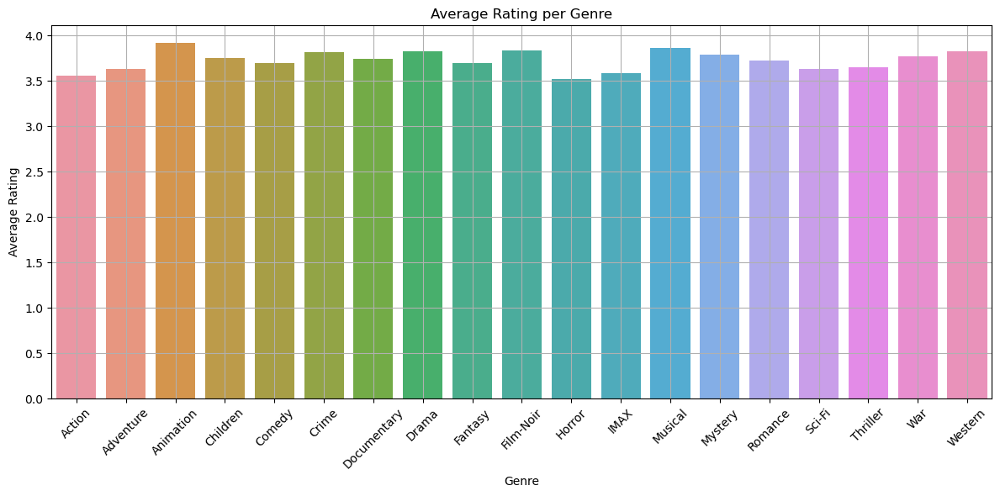

In [59]:
# Average rating by genre
genre_cols = ['Action', 'Adventure', 'Animation', 'Children', 'Comedy', 'Crime',
              'Documentary', 'Drama', 'Fantasy', 'Film-Noir', 'Horror', 'IMAX',
              'Musical', 'Mystery', 'Romance', 'Sci-Fi', 'Thriller', 'War', 'Western']

avg_ratings_by_genre = movie_rating_tags_df[genre_cols + ['rating']].groupby(lambda x: x if x in genre_cols else None, axis=1).mean()
avg_ratings = {genre: movie_rating_tags_df[movie_rating_tags_df[genre] == 1]['rating'].mean() for genre in genre_cols}

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x=list(avg_ratings.keys()), y=list(avg_ratings.values()))
plt.xticks(rotation=45)
plt.title('Average Rating per Genre')
plt.ylabel('Average Rating')
plt.xlabel('Genre')
plt.grid(True)
plt.tight_layout()
plt.show()

When analyzing the average ratings across genres, the results reveal a narrow range—typically between 3.5 and 4.0. This clustering indicates that viewers tend to rate movies across all genres relatively consistently, without any genre standing out as particularly well-loved or disliked. Several factors might contribute to this pattern: rating bias, where users commonly rate movies between 3 and 5; or a balanced distribution of genres, leading to uniform sentiment. Moreover, averaging tends to smooth out outliers, especially low ratings, thereby masking variability in individual user preferences. As a result, average ratings alone may not offer meaningful insight into genre-specific appeal.

#### Genres vs Ratings counts:
To uncover more telling patterns, it’s important to analyze the count of ratings per genre instead. Visualizing Genres vs Rating Counts helps identify which genres are watched or rated more frequently, reflecting popularity and user engagement. This approach can also reveal underrepresented genres, which receive fewer ratings and might require more data to draw reliable conclusions. In summary, while average ratings suggest uniformity in sentiment, rating counts provide a clearer picture of genre popularity and user interest.

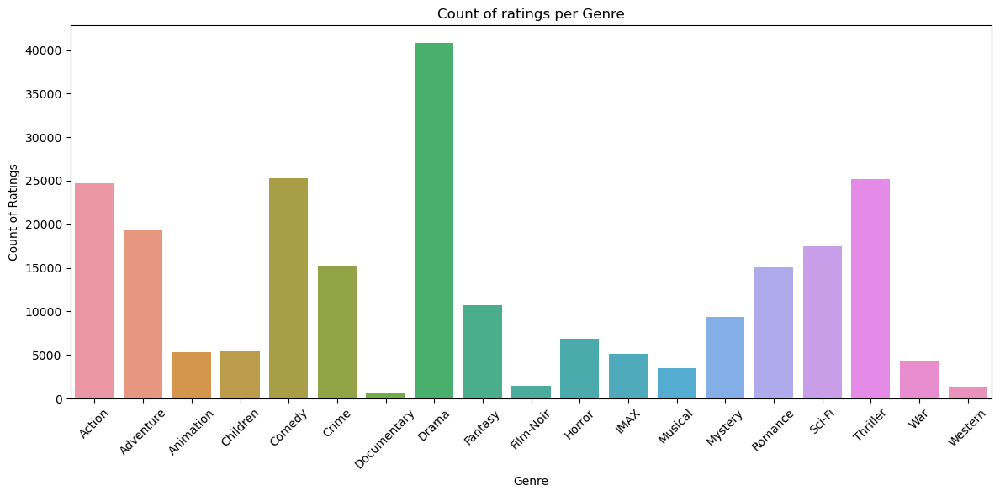

In [61]:
genre_cols = ['Action', 'Adventure', 'Animation', 'Children', 'Comedy', 'Crime',
              'Documentary', 'Drama', 'Fantasy', 'Film-Noir', 'Horror', 'IMAX',
              'Musical', 'Mystery', 'Romance', 'Sci-Fi', 'Thriller', 'War', 'Western']

avg_ratings_by_genre = movie_rating_tags_df[genre_cols + ['rating']].groupby(lambda x: x if x in genre_cols else None, axis=1).count()
avg_ratings = {genre: movie_rating_tags_df[movie_rating_tags_df[genre] == 1]['rating'].count() for genre in genre_cols}

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x=list(avg_ratings.keys()), y=list(avg_ratings.values()))
plt.xticks(rotation=45)
plt.title('Count of ratings per Genre')
plt.ylabel('Count of Ratings')
plt.xlabel('Genre')
plt.tight_layout()
plt.show()

Genre Engagement and Rating Insights
The analysis reveals a clear skew in user engagement across genres, highlighting disparities in both popularity and user participation. Genres such as Drama, Thriller, Comedy, Action, and Adventure have high rating counts, suggesting they are more frequently watched and rated—indicating broad appeal and consistent viewer interest. These genres can be considered safe bets for platforms aiming to recommend widely accepted or trending content.

In contrast, genres like Documentary, Western, and Film-Noir show low rating counts, implying niche audiences or limited visibility. Interestingly, genres such as Musical, Animation, and Film-Noir receive high average ratings despite low participation, suggesting that although fewer users engage with these genres, those who do tend to rate them highly. This points to strong satisfaction among a small audience, presenting potential for content discovery, niche targeting, or promotion to broader audiences.

To deepen this insight, combining rating counts with boxplots or histograms of actual ratings per genre can visually highlight the distribution, spread, and outliers, offering a richer understanding of how each genre is perceived beyond just averages. This multidimensional view is crucial for making informed decisions in content curation and recommendation strategies.
### Movie title vs Average Ratings

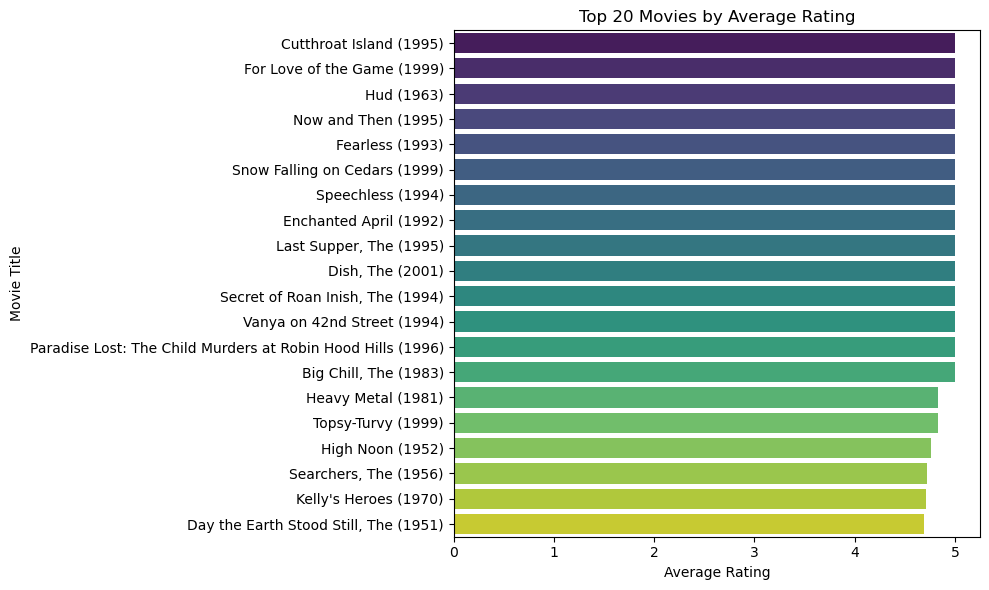

In [63]:
# Average rating per movie
movie_avg_ratings = movie_rating_tags_df.groupby('title')['rating'].mean().sort_values(ascending=False).head(20)

plt.figure(figsize=(10, 6))
sns.barplot(y=movie_avg_ratings.index, x=movie_avg_ratings.values, palette="viridis")
plt.title('Top 20 Movies by Average Rating')
plt.xlabel('Average Rating')
plt.ylabel('Movie Title')
plt.tight_layout()
plt.show()

Very low proportion of users have actually given rating, which has caused the average per movie to be around 5 or 4.5, as seen above. The average has smoothed out the outliers and masked the variance. So, the count of the ratings for movies are visualised.


#### Movie title vs Rating Count:


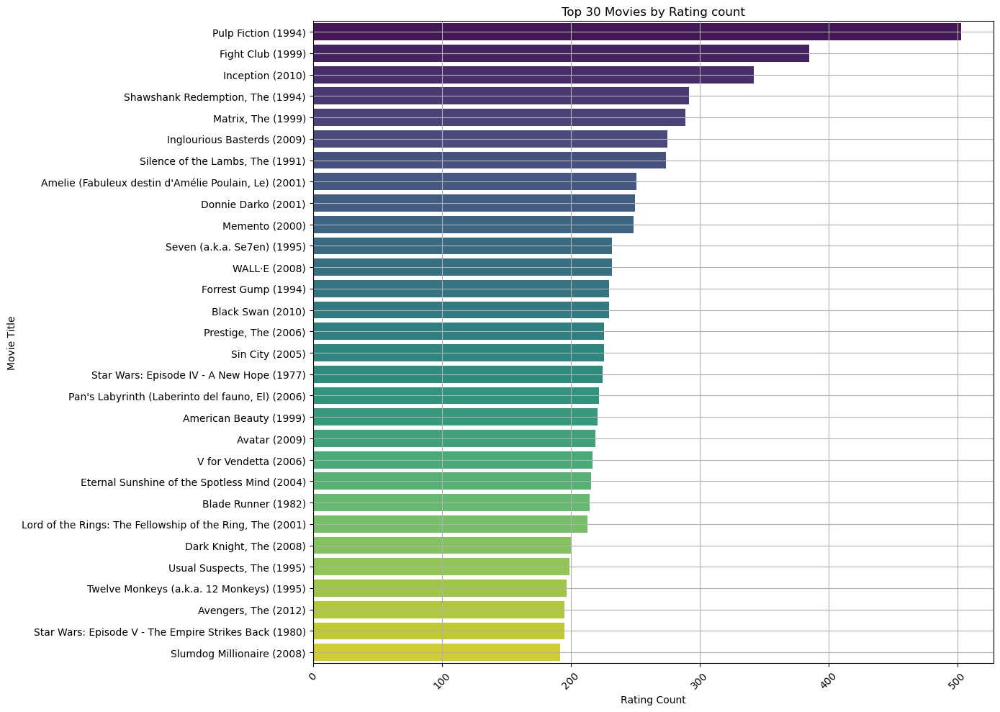

In [66]:
movie_ratings = movie_rating_tags_df.groupby('title')['rating'].count().sort_values(ascending=False).head(30)

plt.figure(figsize=(14, 10))
sns.barplot(y=movie_ratings.index, x=movie_ratings.values, palette="viridis")
plt.title('Top 30 Movies by Rating count')
plt.xlabel('Rating Count')
plt.xticks(rotation=45)
plt.ylabel('Movie Title')
plt.grid(True)
plt.tight_layout()
plt.show()

This plot shows the actual difference in the count of ratings. Pulp fiction, a crime genre has been rated 500 times, followed by Fightclub 380 times.

### Title vs Ratings distribution

In [69]:
# Number of ratings per user
title_rating_counts = movie_rating_tags_df.groupby('title')['rating'].count()
title_rating_counts=title_rating_counts.reset_index()

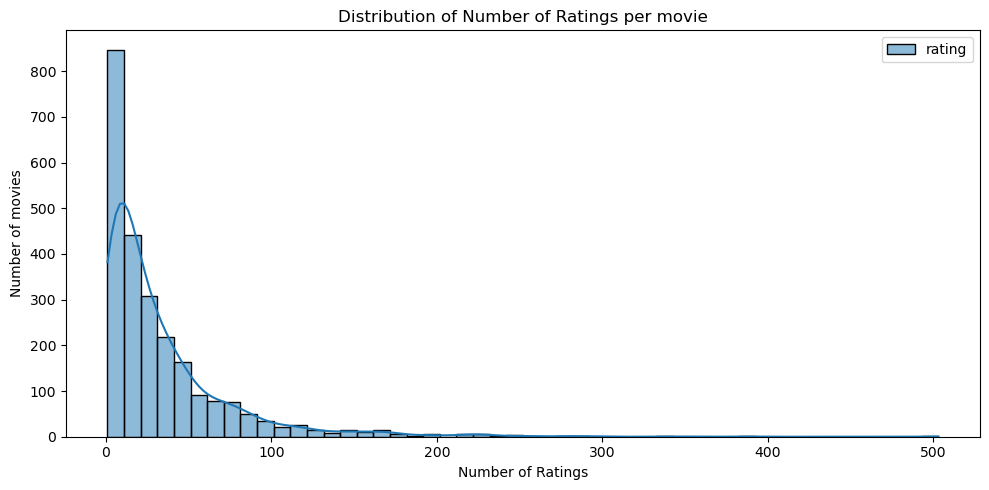

In [70]:

plt.figure(figsize=(10, 5))
sns.histplot(title_rating_counts, bins=50, kde=True)
plt.title('Distribution of Number of Ratings per movie')
plt.xlabel('Number of Ratings')
plt.ylabel('Number of movies')
plt.tight_layout()
plt.show()

The distribution of ratings across movie titles is highly right-skewed.
A small subset of movies receives a disproportionately large number of ratings, while the majority of titles receive very few.
This indicates an imbalanced user engagement, potentially driven by popularity, visibility on platforms, or cultural relevance.

### Users vs Ratings Analysis

Analyzing average ratings per user reveals important behavioral patterns but must be interpreted with caution. On its own, the average rating doesn't accurately reflect a user's overall taste or criticality, mainly due to positivity bias—users are more inclined to rate movies they like, not everything they watch. For instance, User A might only rate their favorite 10 films, resulting in a high average (around 4.5–5), while User B, who rates every movie they watch—including mediocre or bad ones—might have a lower average (e.g., ~3.2). This highlights how average rating per user can be skewed by rating habits and doesn't always capture the full spectrum of their preferences.

To gain more meaningful insights, the number of ratings per user is calculated and visualized. This helps identify user engagement levels, such as highly active users who rate frequently versus casual users who contribute only a few ratings. When combined with average ratings, this metric can show how consistent, lenient, or critical a user is, provided they've rated a diverse and sufficient number of movies. While user rating averages are inherently biased, analyzing rating counts per user allows platforms to better understand user behavior, segment audiences, and tailor recommendations accordingly.

So, users count vs ratings are calculated:

In [73]:
# Number of ratings per user
user_rating_counts = movie_rating_tags_df.groupby('userId')['rating'].count()
user_rating_counts=user_rating_counts.reset_index()

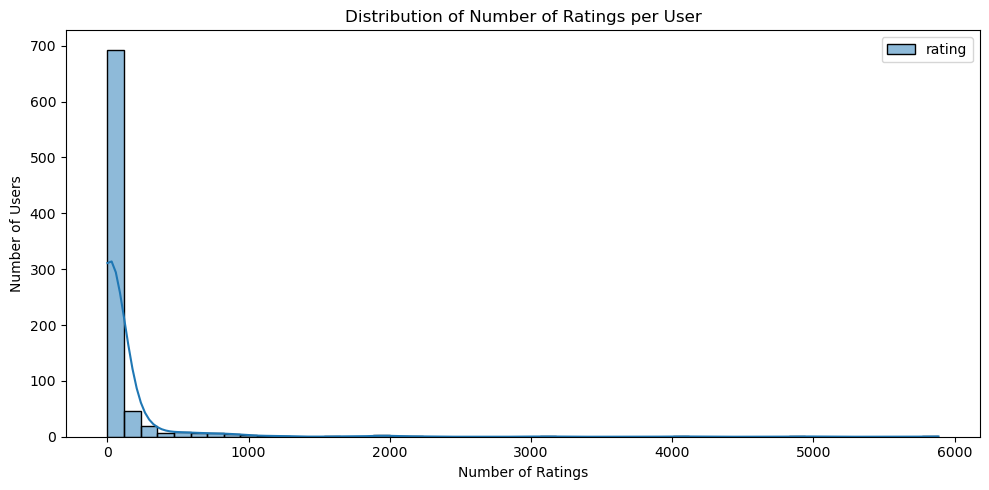

In [74]:

plt.figure(figsize=(10, 5))
sns.histplot(user_rating_counts, bins=50, kde=True)
plt.title('Distribution of Number of Ratings per User')
plt.xlabel('Number of Ratings')
plt.ylabel('Number of Users')
plt.tight_layout()
plt.show()

tHE TOTal number of users are 808. Approx. 700 users have given about 100 ratings.50 users have given 100 ratings, 20 users have given 100 ratings and it goes on with a long tail.
Long tail distribution: A small number of users are highly active (super-users), while the majority contribute sparingly.
##### Implication:

Popular movies may be heavily influenced by a handful of active users. Most users provide limited data, making it harder to personalize recommendations for them.

### Next steps: Visualising the tags by ratings:
To see, the proportion of tags

In [76]:
# Number of ratings per user
tag_rating_counts = movie_rating_tags_df.groupby('tag')['rating'].count()
tag_rating_counts = tag_rating_counts.reset_index().sort_values(by="rating", ascending=False)
tag_rating_counts

,tag,rating
5735,atmospheric,589
5991,based on a book,562
10533,sci-fi,505
10165,quirky,446
11768,twist ending,439
...,...,...
5512,altering history,1
5508,almost too long,1
5507,almost favorite,1
5506,allowance,1


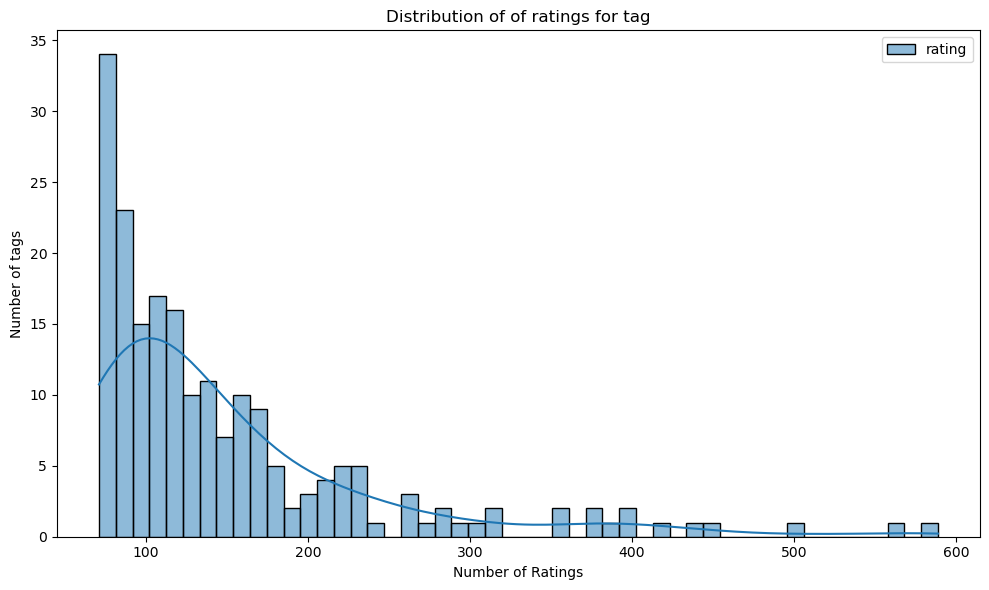

In [77]:

plt.figure(figsize=(10, 6))
sns.histplot(tag_rating_counts.head(200), bins=50, kde=True)
plt.title('Distribution of of ratings for tag')
plt.xlabel('Number of Ratings')
plt.ylabel('Number of tags')
plt.tight_layout()
plt.show()

Most of the tag entries have received only very less ratings, while few tags have obtained greater than high (400) ratings. Only a hanful of ratings have contributed the tags. The plots shows high right skew.

Right-skewed tag distribution: Tags ≠ Ratings. Tagging is sparse and tags are not representative across all movies/users. Tag data is biased. Tagging may reflect the behavior of a small, active group of users. These users might have preferences or habits not shared by the general user base.

### Distribution Analysis of Various Features:
Tags: A relatively small subset of ratings have contributed to the majority of tags. This indicates that only a limited number of ratings are highly influential in terms of tagging.

Users: Out of a total of 808 users, approximately 750+ have contributed to fewer than 1000 ratings. A small number of users have contributed a significantly larger volume of ratings, ranging from 1000 to 6000.

Movie Titles: Around 1800 movies have received fewer than 100 ratings, whereas only a small subset of movies have garnered a high number of ratings, with counts ranging between 200 and 500.

Genres: A small subset of genres have received a disproportionately high frequency of ratings, while the majority of genres have received relatively few ratings, indicating an imbalance in the distribution of ratings across genres.

Ratings: The average rating is 3.7. Most ratings are clustered in the higher range (between 3 and 5), with a peak at 4. However, the distribution is left-skewed, with fewer ratings below 3. This suggests that most users tend to rate movies positively, with fewer extreme low ratings.

From the distribution plots, it is evident that the data follows a right-skewed distribution, with a higher frequency of higher ratings, while lower ratings are relatively sparse.

### Outliers

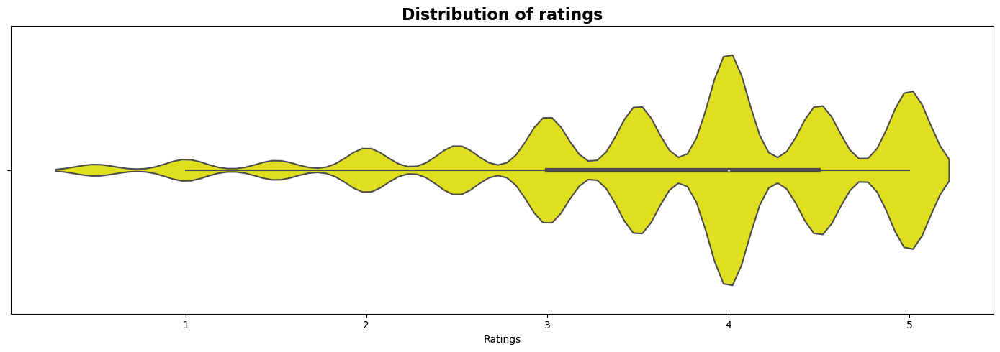

In [81]:
plt.figure(figsize=(14,5))
sns.violinplot(data=movie_rating_tags_df, x="rating", color='yellow')  # Use the correct DataFrame and column
plt.title('Distribution of ratings', fontsize=16, weight="bold")
plt.xlabel('Ratings')
plt.tight_layout()
plt.show()

The plot shows the multimodal at various points, with a left skew due to the few extreme lower ratings. Peaks are observed at 4 followed by 5

### Skewness

In [84]:
# Calculate skewness for all numerical columns

skewness_values = movie_rating_tags_df["rating"].skew()
kurtosis_values = movie_rating_tags_df["rating"].kurt()

# Display skewness values for each column
print(skewness_values, kurtosis_values)


-0.9080239800932751 0.48795744274318364


There is a left-skewed distribution, as evidenced by the skewness value of -0.908. This indicates a slight negative skew in the data, there is a tail towards lower ratings, although the bulk of ratings are still in the higher range.

Additionally, the kurtosis value of 0.488 suggests that the distribution of ratings is relatively platykurtic, meaning it has a flatter peak and lighter tails compared to a normal distribution. This indicates that extreme values (both low and high ratings) occur less frequently than in a normal distribution.

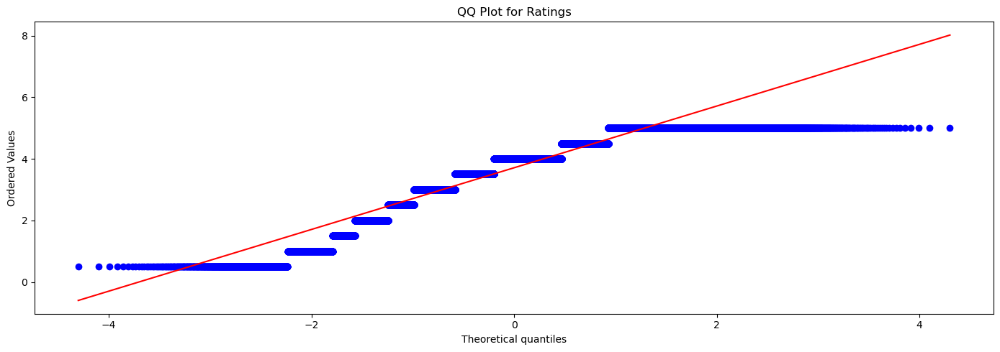

In [86]:
import scipy.stats as stats
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 5))
stats.probplot(movie_rating_tags_df["rating"], dist="norm", plot=plt)
plt.title("QQ Plot for Ratings")
plt.tight_layout()
plt.show()

QQ PLot shows extreme lower tails  and higher tails and it does not follow the normal distribution

### Isolation Forest
This is employed to find the anomalies pattern in the data.ata.

In [88]:
anomalies_df = movie_rating_tags_df.copy()


In [89]:
X_anomaly = anomalies_df["rating"].values.reshape(-1,1)
X_anomaly

array([[0.5],
       [0.5],
       [0.5],
       ...,
       [4. ],
       [4. ],
       [4. ]])

In [90]:
# training the model
from sklearn.ensemble import IsolationForest
anomaly_detector = IsolationForest(contamination=0.05, random_state=0)

In [91]:
#training the data
anomaly_detector.fit(X_anomaly)

IsolationForest(contamination=0.05, random_state=0)

In [92]:
anomaly_scores = anomaly_detector.decision_function(X_anomaly)
anomalies_df["Anomaly_Score"] = anomaly_scores

In [93]:
#setting the anomaly standard and we set a threshhold for the scores

threshold  = anomaly_scores.mean() - 1.5 * anomaly_scores.std()
anomalies_df["Anomaly"] = anomalies_df["Anomaly_Score"] <  threshold

In [94]:
#displaying the results

anomaly_results = anomalies_df[anomalies_df["Anomaly"]== True]

In [95]:
pd.set_option("display.max_rows", None)
anomalies_df[anomalies_df["Anomaly"]== True]

,movieId,title,genres,userId,rating,rating_timestamp,tag,tag_timestamp,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,mean_rating_movie,count_rating_movie,mean_rating_user,count_rating_user,Anomaly_Score,Anomaly
0,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,children,2010-09-15 22:14:29,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.950980,102,3.460674,89,-0.107492,True
1,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,computer animation,2010-09-15 22:14:28,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.950980,102,3.460674,89,-0.107492,True
2,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,Disney,2010-09-15 22:14:20,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.950980,102,3.460674,89,-0.107492,True
3,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,family,2010-09-15 22:14:33,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.950980,102,3.460674,89,-0.107492,True
4,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,Pixar,2010-09-15 22:14:25,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.950980,102,3.460674,89,-0.107492,True
115,2,Jumanji (1995),"[Adventure, Children, Fantasy]",124998,1.5,2014-10-23 18:06:31,bad cgi,2014-10-23 18:06:42,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.138298,47,2.590512,3088,0.000000,True
116,2,Jumanji (1995),"[Adventure, Children, Fantasy]",124998,1.5,2014-10-23 18:06:31,horrifying (but not Horror genre),2014-10-23 18:09:00,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.138298,47,2.590512,3088,0.000000,True
117,2,Jumanji (1995),"[Adventure, Children, Fantasy]",124998,1.5,2014-10-23 18:06:31,Kirsten Dunst,2014-10-23 18:06:50,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.138298,47,2.590512,3088,0.000000,True
118,2,Jumanji (1995),"[Adventure, Children, Fantasy]",124998,1.5,2014-10-23 18:06:31,magic board game,2014-10-23 18:07:17,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.138298,47,2.590512,3088,0.000000,True
119,2,Jumanji (1995),"[Adventure, Children, Fantasy]",124998,1.5,2014-10-23 18:06:31,monkey,2014-10-23 18:07:04,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.138298,47,2.590512,3088,0.000000,True


In [96]:
min_rating = anomalies_df[anomalies_df["Anomaly"]== True]
print(f'The minimum rating is {min_rating["rating"].min()}, and the maximum rating is {min_rating["rating"].max()} in the anomalies')


The minimum rating is 0.5, and the maximum rating is 1.5 in the anomalies


### Analysis: Anomalies:
This shows that the lower ratings are assigned as anomalies, as it was seen in the plot.

In [98]:
anomalies_df.shape

(81812, 33)

In [99]:
anomaly_results.shape

(4759, 33)

In [100]:
### percentage of anumalies:
percentage = (len(anomaly_results)/len(anomalies_df))*100
percentage

5.816995061849117

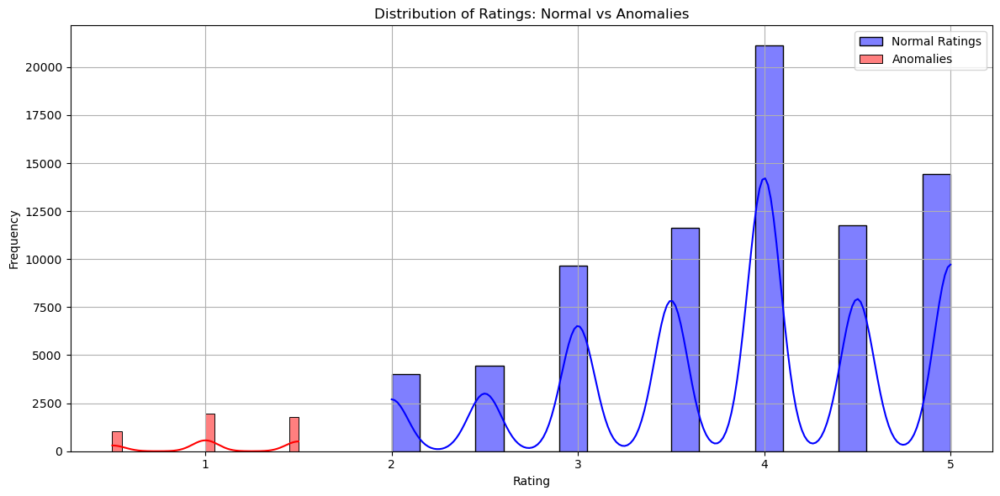

In [101]:
# Plotting the distribution of ratings with anomaly flags
plt.figure(figsize=(12, 6))
sns.histplot(anomalies_df[anomalies_df['Anomaly'] == False]['rating'], color='blue', label='Normal Ratings', kde=True, bins=20)
sns.histplot(anomalies_df[anomalies_df['Anomaly'] == True]['rating'], color='red', label='Anomalies', kde=True, bins=20)
plt.legend()
plt.title('Distribution of Ratings: Normal vs Anomalies')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.grid(True)
plt.tight_layout()
plt.show()

### Anomaly Detection Interpretation:

Based on the anomaly detection using the threshold defined as mean - 2 × standard deviation of the anomaly scores, it is observed that ratings below 1.5 are flagged as anomalies, while the remaining scores are classified as normal. This outcome is consistent with the statistical characteristics of the data. The result aligns well with insights derived from earlier analyses, including the distribution Plot, which showed a significant concentration of ratings lies above 3, with sparse frequency at the lower end. Q-Q Plot which indicated deviation from normality, particularly in the lower tail. Skewness shows the calculated value of -0.91 indicates a left-skewed distribution, where the tail is longer on the left (lower ratings). 

Together, these support the validity of the anomaly detection threshold, confirming that low ratings (especially 0.5 and 1.0) are statistically isolated and infrequent, and thus rightly classified as anomalies.

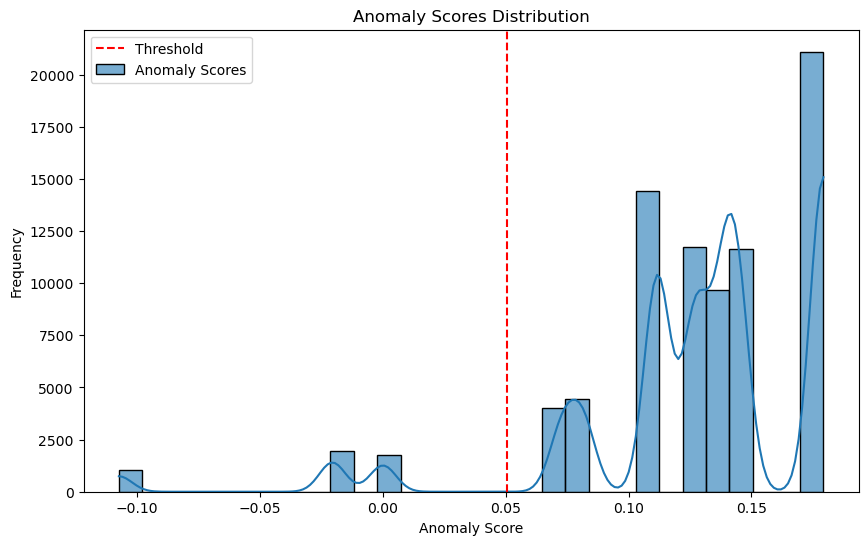

In [103]:
plt.figure(figsize=(10, 6))
sns.histplot(anomalies_df["Anomaly_Score"], kde=True, label="Anomaly Scores", bins=30, alpha=0.6)
plt.axvline(x=threshold, color='red', linestyle='--', label="Threshold")
plt.title("Anomaly Scores Distribution")
plt.xlabel("Anomaly Score")
plt.ylabel("Frequency")
plt.legend()
plt.show()

### Conducting Shapiro-Wilk test

In [105]:
from scipy.stats import shapiro

stat, p_value = shapiro(movie_rating_tags_df["rating"])
shapiro_results = {"Test Statistic": stat, "p-value": p_value}
if p_value < 0.05:
    print(f"stat: {stat:.3f}, p-value: {p_value:.4f}. P_value  < significance level, reject the null hypothesis - non-normality.")
else:
    print(f"stat: {stat:.3f}, p-value: {p_value:.4f}.  P_value > significance level, fail to reject the null hypothesis - normality.")

stat: 0.907, p-value: 0.0000. P_value  < significance level, reject the null hypothesis - non-normality.


p-value is very low, and less than the significance level, so reject the null hypothesis - its non normality
### Next Step: Box-Cox transformation

In [107]:
transformations_df = movie_rating_tags_df.copy()

In [108]:
### Checking for negative values, as Box-Cox transformations require only positive values:
min_value = transformations_df["rating"].min()
print(min_value)

0.5


In [109]:
from scipy import stats
# Apply the Box-Cox transformation. Adding 1 if the feature has values <= 0 to avoid non-positive values
transformations_df["rating_transformed"], _ = stats.boxcox(transformations_df["rating"] + 1)  # Adding 1 if needed


In [110]:
transformations_df.head()

,movieId,title,genres,userId,rating,rating_timestamp,tag,tag_timestamp,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,IMAX,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,mean_rating_movie,count_rating_movie,mean_rating_user,count_rating_user,rating_transformed
0,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,children,2010-09-15 22:14:29,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89,0.670935
1,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,computer animation,2010-09-15 22:14:28,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89,0.670935
2,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,Disney,2010-09-15 22:14:20,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89,0.670935
3,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,family,2010-09-15 22:14:33,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89,0.670935
4,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,Pixar,2010-09-15 22:14:25,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89,0.670935


### Checking for normaity

In [112]:

columns_to_test = {
    "Original Rating": "rating",
    "Transformed Rating": "rating_transformed"
}

print("Shapiro-Wilk Test Results:\n")

for label, column in columns_to_test.items():
    stat, p_value = shapiro(transformations_df[column])
    if p_value < 0.05:
        print(f"{label} -> stat: {stat:.3f}, p-value: {p_value:.4f}. "
              f"P-value < 0.05, reject null → data is **not normally distributed**.")
    else:
        print(f"{label} -> stat: {stat:.3f}, p-value: {p_value:.4f}. "
              f"P-value ≥ 0.05, fail to reject null → data is **normally distributed**.")

Shapiro-Wilk Test Results:

Original Rating -> stat: 0.907, p-value: 0.0000. P-value < 0.05, reject null → data is **not normally distributed**.
Transformed Rating -> stat: 0.941, p-value: 0.0000. P-value < 0.05, reject null → data is **not normally distributed**.


After the Box-Cox transformations, it is observed that there is an improvement in the f-statistic value, through the normality is not achieved.
### QQ plot post Box Cox transformations

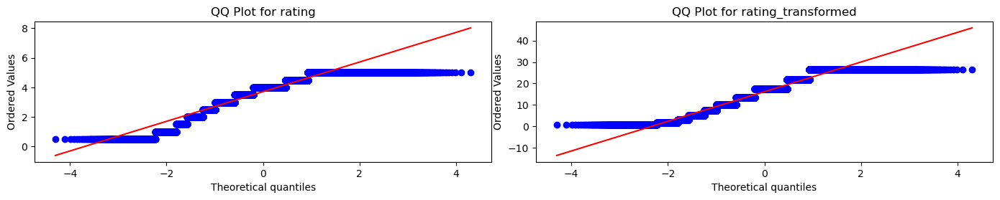

In [114]:
features = ["rating", "rating_transformed"]

plt.figure(figsize=(14, 5))  # Set figure size
for i, feature in enumerate(features, 1):  # Iterate through the selected features
    plt.subplot(len(features), 2, i)  # Adjust grid size for 4 plots
    stats.probplot(transformations_df[feature], dist="norm", plot=plt)  # QQ Plot
    plt.title(f"QQ Plot for {feature}")  # Dynamic title for each feature
plt.tight_layout()  # Adjust layout to avoid overlapping
plt.show()

THere is very less improvement in the extreme values, but there is a mild overall improvement in the pre and the post transformation.

# Next Step - Statistical Tests - Parametric and Non-parametric
Analysis 1 - OLS and Parametric Approach: ANOVA -title, userId, genres with rating.¶

In [117]:
import scipy.stats as stats
from scipy.stats import kruskal
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.stats.api as sms

In [118]:
# Rename columns safely
transformations_df = transformations_df.rename(columns={
    'Film-Noir': 'Film_Noir',
    'Sci-Fi': 'Sci_Fi'
})

##### Using explode() for the genre - to perform ANOVA analysis
For the purpose of performing the ANOVA, the genre columns is exploded. Exploding the genres into individual rows (along with the rating_transformed) allows to treat each genre as a categorical variable for ANOVA. The resulting ANOVA will help to understand how each genre (and interactions with title and userId) impacts the transformed ratings.

### Hypothesis:

##### Null Hypothesis: There is no significant effect of features on the rating.

##### Alternative Hypothesis: There is a significant effect of features on the rating

In [120]:
# Exploding the genres column into individual rows
explode_df = transformations_df.explode('genres')


### ANOVA (One-way)
A one-way ANOVA was used instead of a three-way ANOVA due to memory limitations and performance issues. Initially, a three-way ANOVA involving all three categorical columns (title, tag, and genres) with the rating_transformed variable was attempted, but this approach resulted in a memory error and system crash.

To improve computational efficiency, the dataset was filtered to include only ratings greater than 3.0. Additionally, the genres column was exploded into multiple rows for more granular analysis. However, this transformation significantly increased the dataset size (to approximately 54.2 MB), which further strained memory resources.

To mitigate this, the exploded dataset was saved to a CSV file and reloaded into memory. This reduced in-memory usage and improved processing speed, allowing for one-way ANOVA to be performed on individual factors.

### Exploded genres with rating > 3.0

In [122]:
filtered_df = pd.read_csv("exploded_genres.csv")
filtered_df.head()

,Unnamed: 0,movieId,title,genres,userId,rating,rating_timestamp,tag,tag_timestamp,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film_Noir,Horror,IMAX,Musical,Mystery,Romance,Sci_Fi,Thriller,War,Western,mean_rating_movie,count_rating_movie,mean_rating_user,count_rating_user,rating_transformed
0,51,1,Toy Story (1995),Adventure,27898,3.0,2010-03-06 00:03:04,animation,2012-09-26 08:32:49,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.782495,1908,10.169598
1,51,1,Toy Story (1995),Animation,27898,3.0,2010-03-06 00:03:04,animation,2012-09-26 08:32:49,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.782495,1908,10.169598
2,51,1,Toy Story (1995),Children,27898,3.0,2010-03-06 00:03:04,animation,2012-09-26 08:32:49,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.782495,1908,10.169598
3,51,1,Toy Story (1995),Comedy,27898,3.0,2010-03-06 00:03:04,animation,2012-09-26 08:32:49,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.782495,1908,10.169598
4,51,1,Toy Story (1995),Fantasy,27898,3.0,2010-03-06 00:03:04,animation,2012-09-26 08:32:49,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.782495,1908,10.169598


#### One way ANOVA (genres - exploded)

In [124]:
from statsmodels.formula.api import ols
import statsmodels.api as sm

# Example formula with only genres
formula = 'rating_transformed ~ C(genres)'
model = ols(formula, data=filtered_df).fit()
anova_results = sm.stats.anova_lm(model, typ=2)

print(anova_results)

                 sum_sq       df            F  PR(>F)
C(genres)  2.787094e-23     18.0  1461.573185     0.0
Residual   2.900416e-23  27378.0          NaN     NaN


A one-way ANOVA revealed a statistically significant effect of genre on transformed ratings (F(18, 27378) = 1461.57, p < 0.001), indicating that average transformed ratings vary substantially across different genres.

### One way ANOVA (userId)

In [126]:
from statsmodels.formula.api import ols
import statsmodels.api as sm

# Example formula with only genres
formula = 'rating_transformed ~ C(userId)'
model = ols(formula, data=filtered_df).fit()
anova_results = sm.stats.anova_lm(model, typ=2)

print(anova_results)

                 sum_sq       df          F  PR(>F)
C(userId)  4.347546e-23    286.0  53.386016     0.0
Residual   7.719339e-23  27110.0        NaN     NaN


The ANOVA results show that userId significantly impacts rating_transformed. The F-statistic is  large (53) This indicates a massive difference between user groups. The p-value is 0.0, confirming a highly significant effect of userId. The sum of squares for userId is large (7.97e+06), while the residual sum of squares is minimal, indicating that most variability is explained by userId. userId is a key factor in predicting rating_transformed.

#### One way ANOVA (FOR title)

In [129]:
from statsmodels.formula.api import ols
import statsmodels.api as sm

# Example formula with only genres
formula = 'rating_transformed ~ C(title)'
model = ols(formula, data=filtered_df).fit()
anova_results = sm.stats.anova_lm(model, typ=2)

print(anova_results)

                sum_sq       df         F  PR(>F)
C(title)  8.505182e-23   1748.0  7.885003     0.0
Residual  1.582682e-22  25648.0       NaN     NaN


The ANOVA results show that the title variable significantly impacts the rating_transformed. The F-statistic is 7.89, suggesting significant variability between title groups. The p-value is close to 0.0, indicating a strong rejection of the null hypothesis (i.e., differences between title groups are statistically significant). The sum of squares for title (8.505182e-23) and residuals (1.582682e-22) show some unexplained variability, though the model explains a significant portion. Overall, title is a significant factor in predicting rating_transformed.

### One way ANOVA with tag and ratings_transformed

In [131]:
# Example formula with only genres
formula = 'rating_transformed ~ C(tag)'
model = ols(formula, data=filtered_df).fit()
anova_results = sm.stats.anova_lm(model, typ=2)

print(anova_results)

                sum_sq       df         F  PR(>F)
C(tag)    5.088894e-23   3768.0  2.955141     0.0
Residual  1.079845e-22  23628.0       NaN     NaN


F-statistic: 2.96 — shows the strength of the effect of tag on ratings. p-value: 0.0 — highly significant, meaning the effect of tag on rating_transformed is statistically significant.
C(tag) Sum of Squares: 5.09e-23 — variation in rating_transformed explained by differences in tag. Residual Sum of Squares: 1.08e-22 — unexplained variation.

Conclusion:
Even though individual tags may have small effects, collectively, tag is a significant predictor of rating_transformed. However, the relatively low F-value (~2.96) suggests the practical impact might be modest compared to other factors like userId or title.

#### Multi Factor ANOVA: Only Main effects, no interaction terms:
Another approach: Due to the memory error that was obtained with the exploded genres, the ANOVA analysis was performed with the one hot encoded genres and the title and the userId with only main effects and no interaction terms.

In [134]:
import warnings
warnings.filterwarnings("ignore")

# Replace hyphenated column names with backtick-safe versions
genre_cols = ['Action', 'Adventure', 'Animation', 'Children', 'Comedy', 'Crime',
              'Documentary', 'Drama', 'Fantasy', 'Film_Noir', 'Horror', 'IMAX',
              'Musical', 'Mystery', 'Romance', 'Sci_Fi', 'Thriller', 'War', 'Western']

# Build formula
formula = 'rating_transformed ~ C(title) + C(userId) + ' + ' + '.join(genre_cols)

# Fit model and run ANOVA
model = ols(formula, data=transformations_df).fit()
anova_results = sm.stats.anova_lm(model, typ=2)
print(anova_results)

                   sum_sq       df           F        PR(>F)
C(title)     9.380721e+05   2452.0   14.155572  0.000000e+00
C(userId)    9.326412e+05    807.0   42.761485  0.000000e+00
Action       1.550181e+02      1.0    5.735802  1.662480e-02
Adventure    2.785915e+00      1.0    0.103081  7.481638e-01
Animation    4.371301e+03      1.0  161.741836  5.124417e-37
Children     1.516182e+02      1.0    5.610002  1.786064e-02
Comedy       1.453906e+01      1.0    0.537957  4.632827e-01
Crime        1.901789e+00      1.0    0.070368  7.908027e-01
Documentary  4.329423e+00      1.0    0.160192  6.889806e-01
Drama        6.977444e+00      1.0    0.258171  6.113807e-01
Fantasy      1.468519e+01      1.0    0.543364  4.610440e-01
Film_Noir    6.397447e+02      1.0   23.671097  1.145071e-06
Horror       5.729308e+01      1.0    2.119893  1.454007e-01
IMAX         3.765926e+02      1.0   13.934247  1.894510e-04
Musical      2.709670e+01      1.0    1.002601  3.166851e-01
Mystery      1.306170e+0

The ANOVA results show that various factors (such as title, userId, and individual genres) are examined for their effect on rating_transformed. 
Key Observations:

##### C(title): The F-statistic is 14.16, and the p-value is 0.000000e+00, indicating that title has a highly significant effect on the ratings.

##### C(userId): The F-statistic is 42.76, with a p-value of 0.000000e+00, indicating a highly significant effect of userId on rating_transformed as well.

##### Significant Genres:

Animation has a very significant effect (F = 161.74, p-value ≈ 5.12e-37). Film_Noir is also significant (F = 23.67, p-value ≈ 1.15e-06). IMAX is significant (F = 13.93, p-value ≈ 1.89e-04). Mystery (F = 4.83, p-value ≈ 2.79e-02) and Thriller (F = 4.74, p-value ≈ 2.95e-02) show marginal significance.

##### Non-Significant Genres:

Many genres such as Adventure, Comedy, Crime, Documentary, Drama, Fantasy, Sci_Fi, Romance, Horror, War, and Western have high p-values, indicating no significant effect on the ratings.

Conclusion:
Main Findings: title and userId are significant predictors of rating_transformed. Among genres, only a few (such as Animation, Film_Noir, IMAX) significantly impact the ratings. 

### Tukey HSD test:
performing Tukey’s HSD (Honestly Significant Difference) test after ANOVA allows to determine which specific groups (genres) differ significantly in their effects on the rating_transformed variable.

Since one-hot encoded genre columns are used (e.g., Action, Animation, etc.), Tukey HSD works best if melted the data back into a long format where each row has just one genre label per rating.



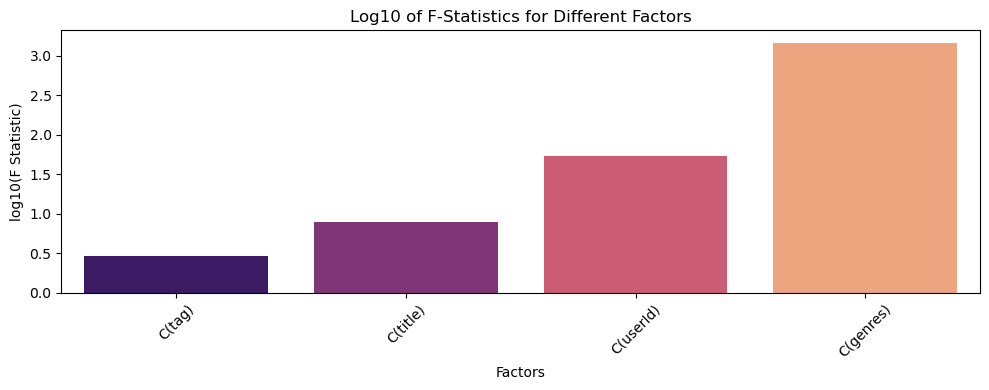

In [138]:
f_statistics = {
    'C(tag)': 2.955141,
    'C(title)': 7.885003,
    'C(userId)': 53.386016,
    'C(genres)': 1461.573185
}

# Convert to log scale (base 10)
log_f_values = {k: np.log10(v) for k, v in f_statistics.items()}

# Plotting
plt.figure(figsize=(10, 4))
sns.barplot(x=list(log_f_values.keys()), y=list(log_f_values.values()), palette='magma')

# Labeling
plt.title('Log10 of F-Statistics for Different Factors')
plt.xlabel('Factors')
plt.ylabel('log10(F Statistic)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Conclusion: 
The bar chart showing the F-statistics for each predictor of rating_transformed. genres has the highest F-statistic, indicating the strongest predictive power, followed by userId. title is also strong predictor. tag, while statistically significant, has a much lower F-statistic, suggesting limited impact.

In [140]:
transformations_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81812 entries, 0 to 81811
Data columns (total 32 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   movieId             81812 non-null  category      
 1   title               81812 non-null  object        
 2   genres              81812 non-null  object        
 3   userId              81812 non-null  category      
 4   rating              81812 non-null  float64       
 5   rating_timestamp    81812 non-null  datetime64[ns]
 6   tag                 81812 non-null  object        
 7   tag_timestamp       81812 non-null  datetime64[ns]
 8   Action              81812 non-null  int32         
 9   Adventure           81812 non-null  int32         
 10  Animation           81812 non-null  int32         
 11  Children            81812 non-null  int32         
 12  Comedy              81812 non-null  int32         
 13  Crime               81812 non-null  int32     

In [141]:
transformations_df.to_csv("transformations_df.csv", index=False, encoding="utf_8")


movieId	, genres, rating_timestamp, tag_timestamp, tag, mean_rating_movie	count_rating_movie	mean_rating_user	count_rating_user

title		userId	rating				Action	Adventure	Animation	Children	Comedy	Crime	Documentary	Drama	Fantasy	Film-Noir	Horror	IMAX	Musical	Mystery	Romance	Sci-Fi	Thriller	War	Western		rating_transformed

# Experiment 1: Baseline Clustering
##### Objective:
Baseline Clustering aimed to establish an initial benchmark for unsupervised clustering performance by using all available numerical features while intentionally excluding object-type fields. The goal was to observe how well clustering algorithms can segment the data based on inherent structure, without much preprocessing interventions. Features included genre indicators (e.g., Action, Drama, Sci_Fi), a normalized rating feature (rating_transformed via Box-Cox transformation), and aggregated statistics such as mean_rating_user, count_rating_user, mean_rating_movie, and count_rating_movie. No feature scaling was applied, allowing the models to operate on the original data distributions. This setup was designed to assess the influence of user and movie rating values and genre prevalence on clustering outcomes and serves as a foundational reference for interpreting future experiments that incorporate scaling, feature engineering, or user-centric validation.

In [144]:
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, OPTICS
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from sklearn_extra.cluster import KMedoids

In [145]:
transformations_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81812 entries, 0 to 81811
Data columns (total 32 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   movieId             81812 non-null  category      
 1   title               81812 non-null  object        
 2   genres              81812 non-null  object        
 3   userId              81812 non-null  category      
 4   rating              81812 non-null  float64       
 5   rating_timestamp    81812 non-null  datetime64[ns]
 6   tag                 81812 non-null  object        
 7   tag_timestamp       81812 non-null  datetime64[ns]
 8   Action              81812 non-null  int32         
 9   Adventure           81812 non-null  int32         
 10  Animation           81812 non-null  int32         
 11  Children            81812 non-null  int32         
 12  Comedy              81812 non-null  int32         
 13  Crime               81812 non-null  int32     

In [146]:
X = transformations_df.drop(columns = ["movieId", "userId", "title", "rating", "genres", "rating_timestamp", "tag_timestamp", "tag"])

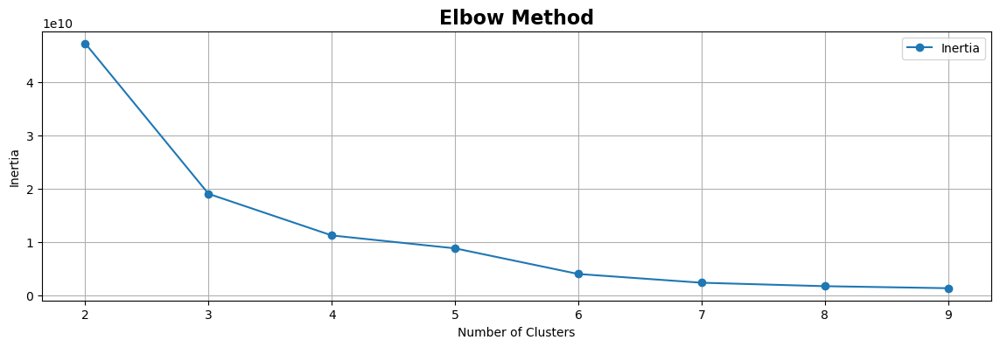

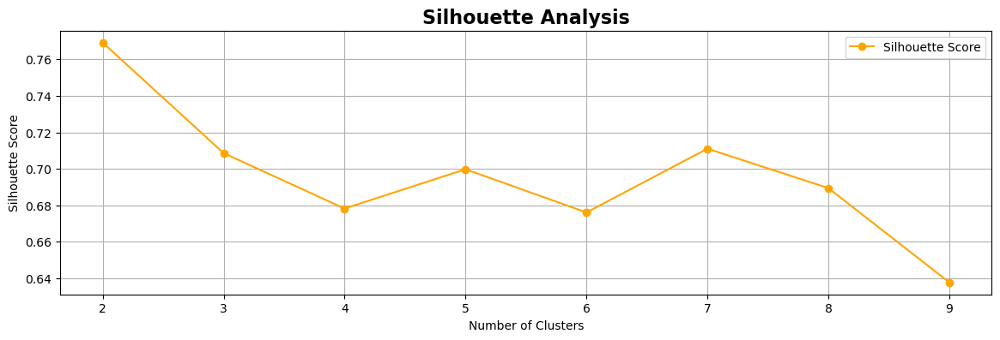

In [147]:
from sklearn.metrics import silhouette_score

inertia_values = []
silhouette_scores = []

# different numbers of clusters
for n_clusters in range(2, 10):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42).fit(X)
    inertia_values.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X, kmeans.labels_))

# Plot the Elbow Method
plt.figure(figsize=(14,4))
plt.plot(range(2, 10), inertia_values, marker='o', label='Inertia')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method',  fontsize=16, weight="bold")
plt.legend()
plt.grid(True)
plt.show()

# Plot the Silhouette Scores
plt.figure(figsize=(14,4))
plt.plot(range(2, 10), silhouette_scores, marker='o', color='orange', label='Silhouette Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis',  fontsize=16, weight="bold")
plt.legend()
plt.grid(True)
plt.show()

The Elbow method and Silhouette scores indicate moderate to strong clustering performance using KMeans in this baseline setup. Notably, the configurations with 2, 3, and 7 clusters yielded promising silhouette scores of 0.77, 0.71, and 0.71 respectively, suggesting a relatively clear separation between clusters. These results imply that even without feature scaling, the model was able to capture some meaningful structure in the data. To further investigate the quality and distinctiveness of these clusters, a PCA plot was generated, providing a visual representation of cluster separation in reduced dimensional space. This helps validate the observed clustering behavior and sets the stage for deeper analysis in subsequent experiments.

In [149]:
from sklearn.decomposition import PCA

# Reduce to 2D with PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)


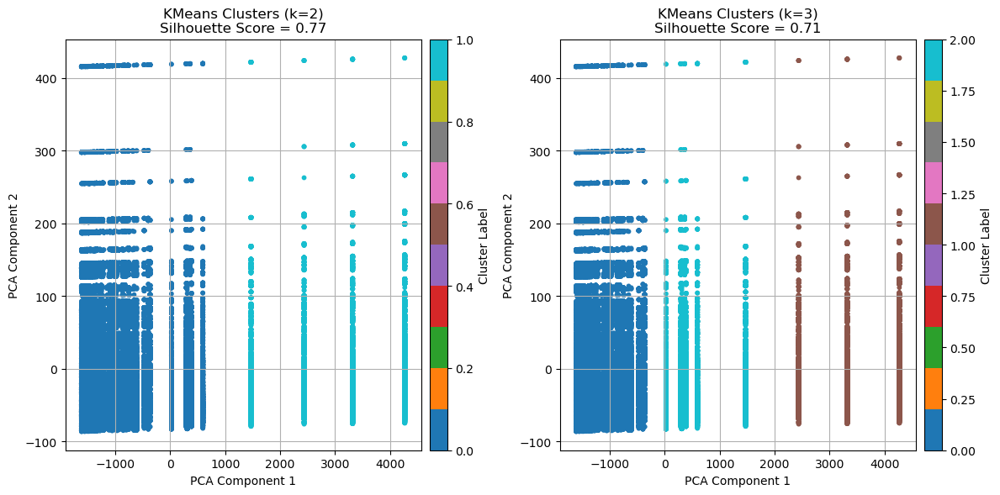

In [150]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Set up subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

for i, k in enumerate([2, 3]):
    # Fit KMeans
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X)
    sil_score = silhouette_score(X, labels)
    transformations_df[f"KMeans_Cluster_{k}"] = labels


    # Plot clusters on the subplots
    scatter = axs[i].scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='tab10', s=10)
    axs[i].set_title(f'KMeans Clusters (k={k})\nSilhouette Score = {sil_score:.2f}')
    axs[i].set_xlabel('PCA Component 1')
    axs[i].set_ylabel('PCA Component 2')
    axs[i].grid(True)

    # Add colorbar for each subplot (one per axis)
    divider = make_axes_locatable(axs[i])
    cax = divider.append_axes("right", size="5%", pad=0.1)
    cbar = plt.colorbar(scatter, cax=cax)
    cbar.set_label('Cluster Label')

plt.tight_layout()
plt.show()

Cluster 2 and Cluster 3 show clear separation between the clusters. The Silhoutte score shows cluster 2 has high value than clusters 3. But due to the type of 19 genres, clusters 7 is also analysed to see the difference.

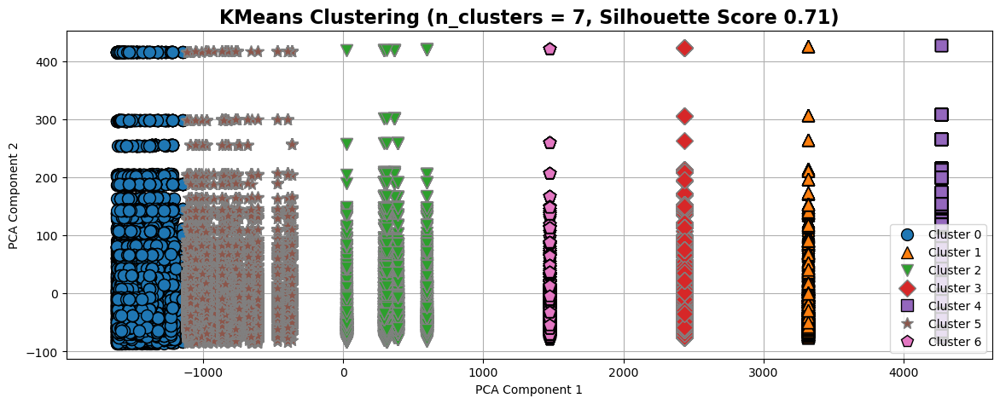

In [152]:
import mglearn

# Perform KMeans clustering
y_pred_kmeans = KMeans(n_clusters=7, random_state=42).fit_predict(X)
sil_score = silhouette_score(X, y_pred_kmeans)
transformations_df['kmeans_cluster_7'] = y_pred_kmeans

# Plot the clusters
plt.figure(figsize=(14, 5))
mglearn.discrete_scatter(X_pca[:, 0], X_pca[:, 1], y_pred_kmeans)

# Set correct cluster labels based on actual prediction order
plt.legend(["Cluster 0", "Cluster 1", "Cluster 2", "Cluster 3", "Cluster 4", "Cluster 5", "Cluster 6"], loc='lower right')

plt.title(f"KMeans Clustering (n_clusters = 7, Silhouette Score {sil_score:.2f})", fontsize=16, weight="bold")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.grid(True)
plt.show()

In the configuration with 7 clusters, the model demonstrated strong performance, showing clear separation among most clusters. This clustering result also reflects the sparse nature of the dataset, with several well-defined groupings and limited density. However, two clusters—Cluster 0 and Cluster 5—show slight overlap, indicating potential feature similarity or ambiguity between them. To investigate this further, a cluster analysis was conducted to examine the distribution of features across the clusters, aiming to identify which attributes contribute to this overlap. Understanding which features are shared or mixed between Clusters 0 and 5 can provide insights into their composition and inform adjustments in preprocessing or model configuration. Following this analysis, cluster labels for the 2, 3, and 7-cluster KMeans models were added to the main dataset to enable further comparative analysis and interpretation.
### Adding the 2, 3, 7 clusters to the main dataset

In [154]:
transformations_df.head()

,movieId,title,genres,userId,rating,rating_timestamp,tag,tag_timestamp,Action,Adventure,Animation,Children,Comedy,Crime,Documentary,Drama,Fantasy,Film_Noir,Horror,IMAX,Musical,Mystery,Romance,Sci_Fi,Thriller,War,Western,mean_rating_movie,count_rating_movie,mean_rating_user,count_rating_user,rating_transformed,KMeans_Cluster_2,KMeans_Cluster_3,kmeans_cluster_7
0,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,children,2010-09-15 22:14:29,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89,0.670935,0,0,0
1,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,computer animation,2010-09-15 22:14:28,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89,0.670935,0,0,0
2,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,Disney,2010-09-15 22:14:20,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89,0.670935,0,0,0
3,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,family,2010-09-15 22:14:33,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89,0.670935,0,0,0
4,1,Toy Story (1995),"[Adventure, Animation, Children, Comedy, Fantasy]",108922,0.5,2010-09-15 22:14:06,Pixar,2010-09-15 22:14:25,0,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3.95098,102,3.460674,89,0.670935,0,0,0


### Analysing the correlation between the clusters formed with the features

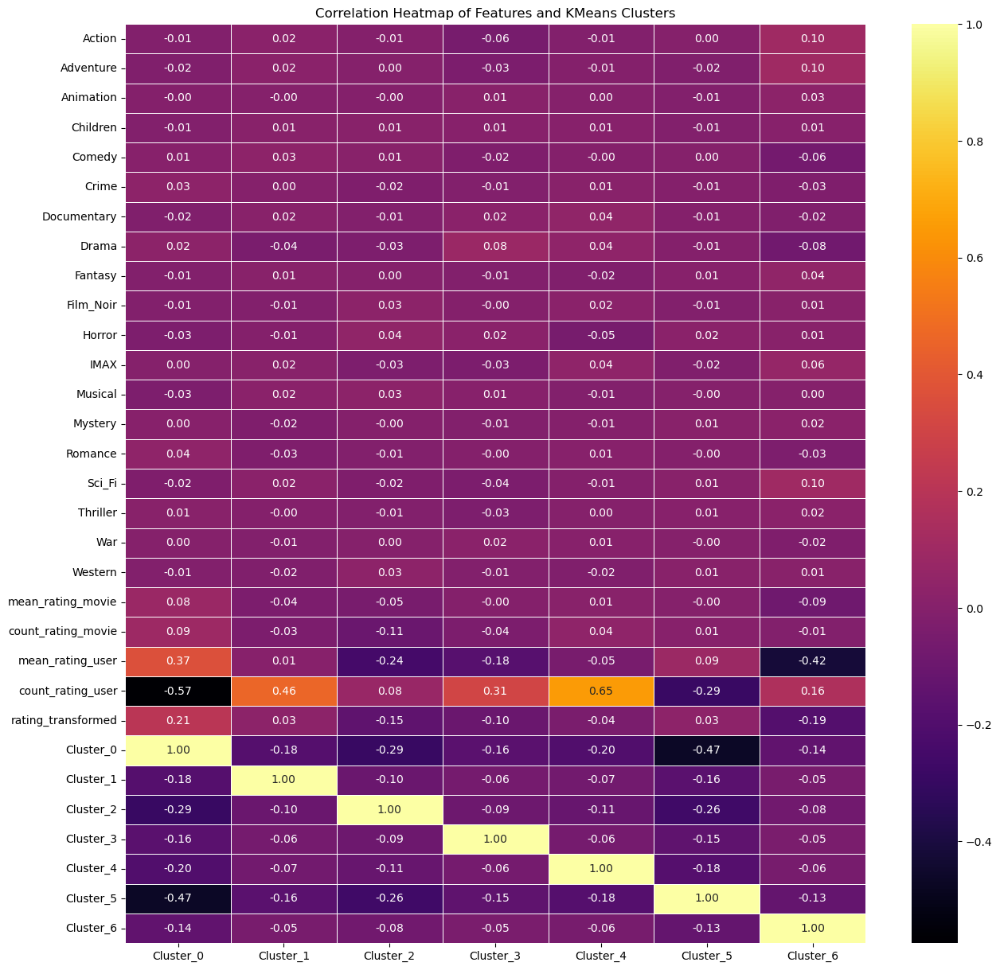

In [156]:
features = X

encoded_clusters = pd.get_dummies(transformations_df['kmeans_cluster_7'], prefix = "Cluster")

combined = pd.concat([features, encoded_clusters], axis=1)

correlation_matrix = combined.corr()

cluster_correlation = correlation_matrix.loc[:, encoded_clusters.columns]

# Plot the heatmap
plt.figure(figsize=(15, 15))
sns.heatmap(cluster_correlation, annot=True, cmap="inferno", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap of Features and KMeans Clusters")
plt.show()

In the 7-cluster KMeans configuration, Cluster 0 is primarily characterized by the feature mean_rating_user. Cluster 5, on the other hand, represents the inverse of Cluster 0, with a contrasting profile in mean_rating_user—specifically, showing a negative correlation of -0.47 relative to Cluster 0. However, there is a degree of overlap, as some users in Cluster 5 also exhibit alignment with the mean_rating_user feature, which may explain the slight blending observed between these two clusters. Clusters 1, 3, and 4 are predominantly shaped by the count of ratings per user, reflecting different levels of user engagement or activity. Meanwhile, Cluster 6 demonstrates a clear correlation with genre preferences, particularly favoring genres such as Action, Adventure, Sci-Fi, and Fantasy, suggesting content-based tendencies are influential in its formation.

### Comparison for Clusters 2:

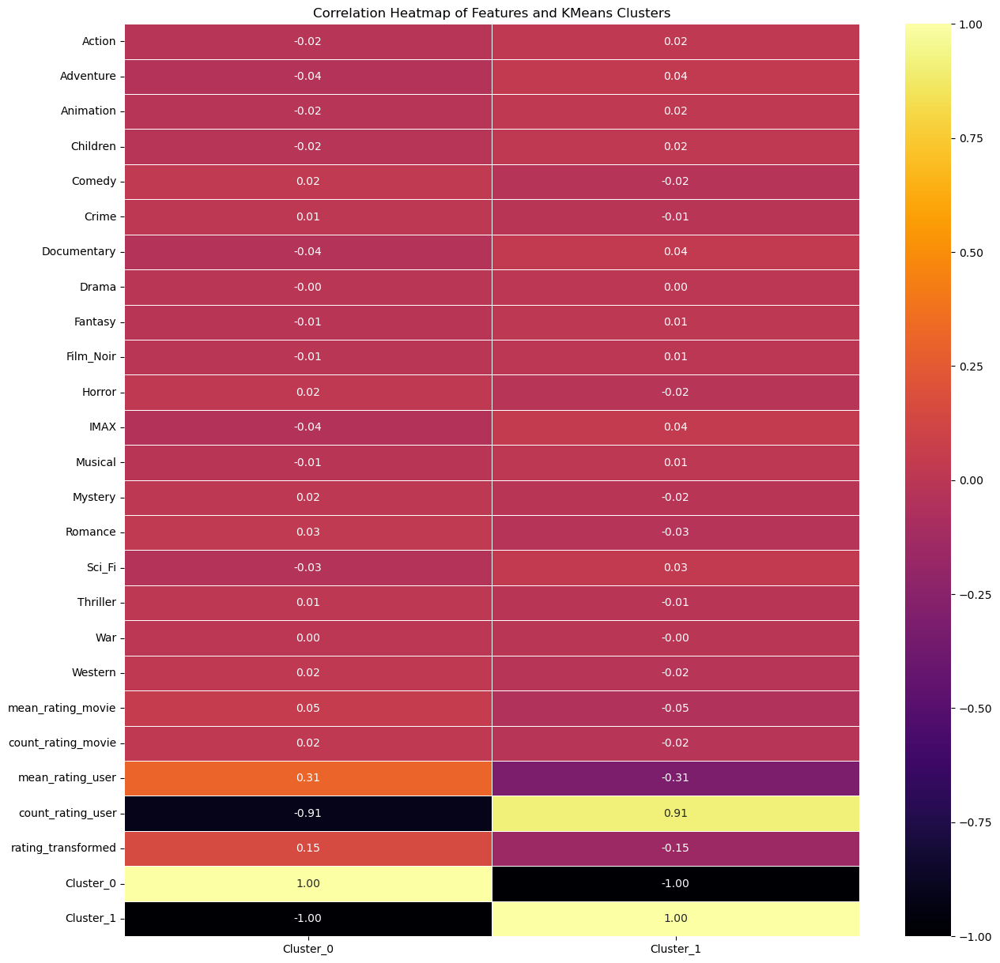

In [158]:
features = X

encoded_clusters = pd.get_dummies(transformations_df['KMeans_Cluster_2'], prefix = "Cluster")

combined = pd.concat([features, encoded_clusters], axis=1)

correlation_matrix = combined.corr()

cluster_correlation = correlation_matrix.loc[:, encoded_clusters.columns]

# Plot the heatmap
plt.figure(figsize=(15, 15))
sns.heatmap(cluster_correlation, annot=True, cmap="inferno", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap of Features and KMeans Clusters")
plt.show()

In the 2-cluster configuration, Cluster 1 is predominantly driven by the feature count_rating_user, while Cluster 0 reflects users with average ratings. Notably, the count and average rating of movies had minimal influence in this split, pointing to user-based features as the primary drivers.
### Comparison for Clusters 3

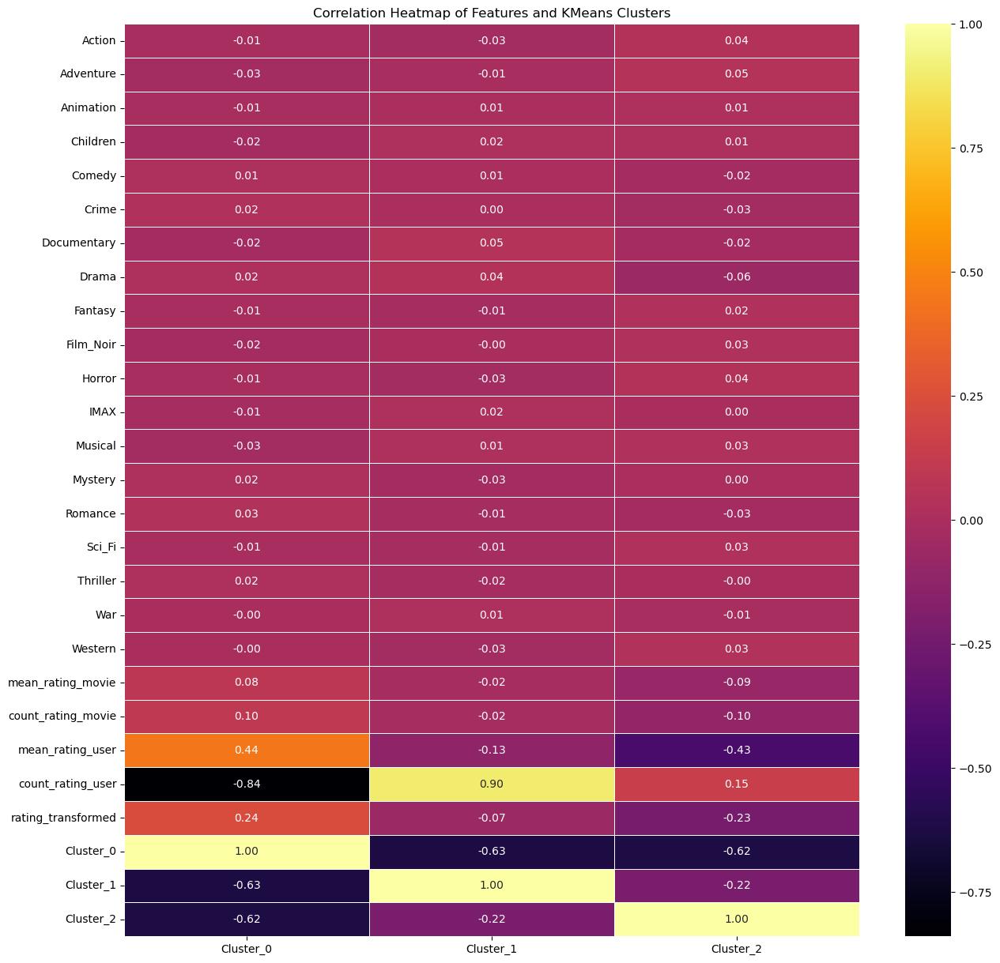

In [160]:
features = X

encoded_clusters = pd.get_dummies(transformations_df['KMeans_Cluster_3'], prefix = "Cluster")

combined = pd.concat([features, encoded_clusters], axis=1)

correlation_matrix = combined.corr()

cluster_correlation = correlation_matrix.loc[:, encoded_clusters.columns]

# Plot the heatmap
plt.figure(figsize=(15, 15))
sns.heatmap(cluster_correlation, annot=True, cmap="inferno", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap of Features and KMeans Clusters")
plt.show()

Cluster_1 is primarily based on the count_rating_user and the cluster_0 is the inverse and based on the average rating_user, count and average rating of the movies. Cluster_2 has somewhat correlation with the different genres.

### Conclusion
The exploratory data analysis (EDA) revealed significant variation in both the average and count of ratings across users and genres. This pattern reflects the inherent sparsity of the dataset, where only a subset of users rate a subset of movies. As a result, user-level features such as rating frequency and rating tendencies are spread unevenly, and the clustering algorithm naturally groups users based on these characteristics. The KMeans algorithm effectively identified this structure, forming clusters primarily along the axes of mean and count of user ratings, with limited but notable influence from genre preferences and movie-level statistics. This confirms that even in an unsupervised setting, KMeans can extract meaningful segmentation from behavioral patterns embedded in user-movie interactions.

### Next Step: DBSCAN clustering


In [162]:
X = transformations_df.drop(columns = ["movieId", "userId", "title", "rating", "genres", "rating_timestamp", "tag_timestamp", "tag"])

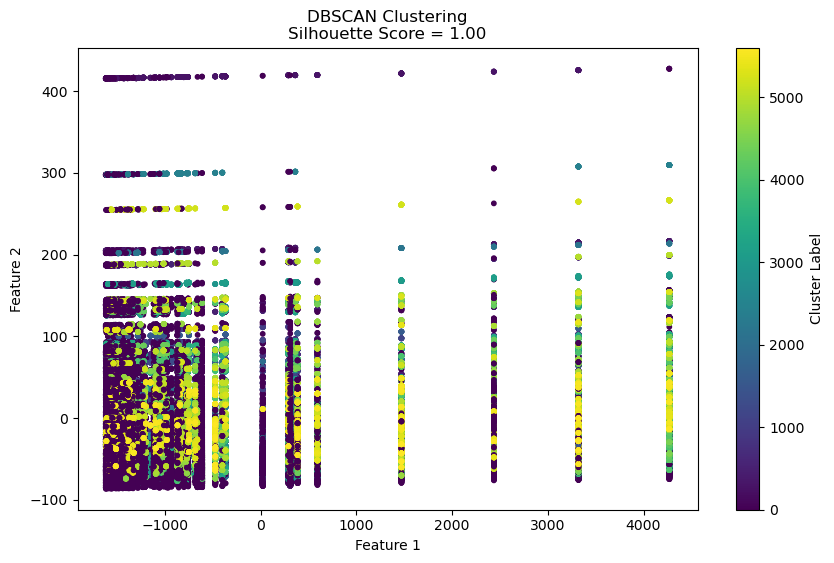

Estimated clusters: 5603
Noise points: 35560
Silhouette Score for DBSCAN: 1.00


In [163]:
dbscan = DBSCAN(eps=1.0, min_samples=5) 
dbscan_labels = dbscan.fit_predict(X)

# Handle noise points (-1) in silhouette score calculation by excluding them
mask = dbscan_labels != -1
silhouette_avg = silhouette_score(X[mask], dbscan_labels[mask]) if mask.any() else -1  # Only compute if there are clusters

# Visualize clusters
plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=dbscan_labels, cmap='viridis', s=10)
plt.colorbar(label="Cluster Label")
plt.title(f'DBSCAN Clustering\nSilhouette Score = {silhouette_avg:.2f}')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

# Optional: print summary (fix variable names)
n_clusters = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)  # Exclude noise points (-1)
n_noise = list(dbscan_labels).count(-1)  # Count the noise points labeled as -1
print(f"Estimated clusters: {n_clusters}")
print(f"Noise points: {n_noise}")

print(f"Silhouette Score for DBSCAN: {silhouette_avg:.2f}")

A silhouette score of 1.00 typically indicates perfect clustering, where all assigned points are well-separated from other clusters and tightly grouped within their own cluster. However, in practice — especially with real-world data — such a perfect score is extremely rare and often points to a misleading outcome. In this case, although the score is high, DBSCAN labeled a large portion of the dataset as noise (35,560 points), and the remaining clusters likely contain very few data points. These tiny or singleton clusters are trivially well-separated, artificially inflating the silhouette score for the non-noise points.

#### Next step: Tuning the parameters:

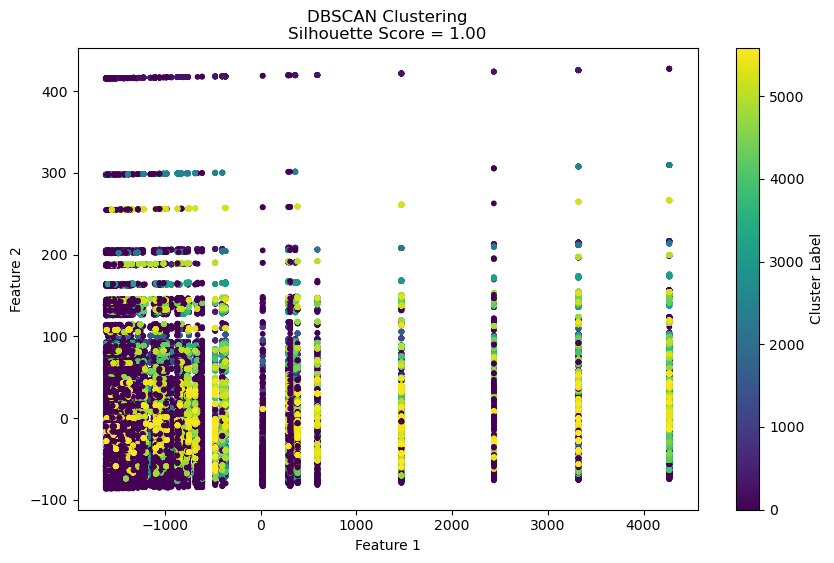

Estimated clusters: 5588
Noise points: 35723
Silhouette Score for DBSCAN: 1.00


In [165]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan_labels = dbscan.fit_predict(X)

# Handle noise points (-1) in silhouette score calculation by excluding them
mask = dbscan_labels != -1
silhouette_avg = silhouette_score(X[mask], dbscan_labels[mask]) if mask.any() else -1  # Only compute if there are clusters

# Visualize clusters
plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=dbscan_labels, cmap='viridis', s=10)
plt.colorbar(label="Cluster Label")
plt.title(f'DBSCAN Clustering\nSilhouette Score = {silhouette_avg:.2f}')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

# Optional: print summary (fix variable names)
n_clusters = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)  # Exclude noise points (-1)
n_noise = list(dbscan_labels).count(-1)  # Count the noise points labeled as -1
print(f"Estimated clusters: {n_clusters}")
print(f"Noise points: {n_noise}")

print(f"Silhouette Score for DBSCAN: {silhouette_avg:.2f}")

This result — 5,588 clusters, 35,723 noise points, and a silhouette score of 1.00 — again suggests that DBSCAN is severely over-fragmenting your data, and the high silhouette score is not a sign of good clustering. 

Several factors likely contributed to this behavior:

##### High Dimensionality & Sparsity:
The dataset includes one-hot encoded features (e.g., genre indicators), which leads to sparse, high-dimensional space. In such cases, distances between points become less meaningful due to the curse of dimensionality, making density-based clustering difficult.

##### Unscaled Feature Ranges:
There is a mismatch in feature scales — rating counts may be in the hundreds, while average ratings are typically in the 1–5 range. Without scaling, features with larger magnitudes (like count features) dominate the distance metric, skewing the clustering.

##### Parameter Sensitivity:
With min_samples=5, DBSCAN requires at least 5 neighbors within the specified eps=1.0. If the data is spread out (as is common in sparse, unscaled data), few regions satisfy this condition, resulting in many points being labeled as noise. The algorithm then forms many small or even singleton clusters, over-fragmenting the dataset.

### Next steps: Conclusion
In this case, the high silhouette score does not indicate good clustering performance, but rather reflects a side-effect of inappropriate parameter tuning and data scaling in a sparse, high-dimensional space. The large number of noise points and excessive micro-clusters suggest that the current DBSCAN configuration is not yielding meaningful structure. Proper feature scaling and careful tuning of eps and min_samples — potentially guided by a k-distance graph — are critical next steps to achieve interpretable and useful clustering results.


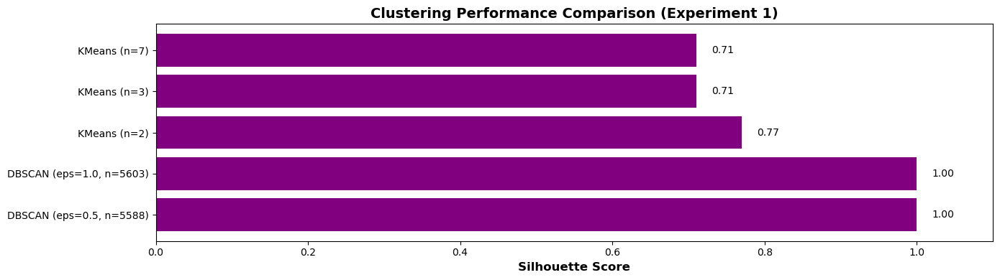

In [167]:
import matplotlib.pyplot as plt
# Method names
methods = [
    "DBSCAN (eps=0.5, n=5588)",
    "DBSCAN (eps=1.0, n=5603)",
    "KMeans (n=2)",
    "KMeans (n=3)",
    "KMeans (n=7)"
]

# Corresponding Silhouette scores
scores = [
    1.00,  # DBSCAN eps=0.5
    1.00,  # DBSCAN eps=1.0
    0.77,  # KMeans n=2
    0.71,  # KMeans n=3
    0.71   # KMeans n=7
]

# Create a horizontal bar plot
plt.figure(figsize=(14, 4))
bars = plt.barh(methods, scores, color='purple')

# Draw a vertical line at 0 for reference
plt.axvline(0, color='gray', linestyle='--')

# Label each bar with the silhouette score
for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.02, bar.get_y() + bar.get_height()/2,
             f"{width:.2f}", va='center')

plt.xlabel("Silhouette Score", fontsize=12, weight="bold")
plt.title("Clustering Performance Comparison (Experiment 1)", fontsize=14, weight="bold")
plt.xlim(0, 1.1)  # Extend slightly beyond 1.0 to accommodate text
plt.tight_layout()
plt.show()

### Conclusion:
The results demonstrate that KMeans with 2, 3, and 7 clusters produced relatively strong silhouette scores, indicating good intra-cluster cohesion and inter-cluster separation. These configurations suggest that KMeans was able to capture some meaningful structure in the data, even without feature scaling.

In contrast, DBSCAN yielded a silhouette score of 1.00 for both tested configurations. However, this perfect score is misleading. It reflects not genuine clustering quality, but rather a consequence of inappropriate parameter choices and the nature of the high-dimensional, sparse dataset. The DBSCAN runs resulted in thousands of small clusters and tens of thousands of noise points, which typically indicate over-fragmentation and poor overall structure.

These outcomes suggest that DBSCAN, in its current setup, is not effectively segmenting the data. To improve its performance, it is essential to apply feature scaling (e.g., StandardScaler or MinMaxScaler in the further experiments) and to tune the parameters more carefully, ideally using a k-distance plot to guide the selection of a meaningful eps value. This would help identify denser regions in the data and result in more interpretable, well-separated clusters.


# Experiment 2: Baseline models - Scaling and Normalising: L1 Normalisation;
Preservation of Sparsity:
Sparse data often arises in contexts like text mining (TF-IDF vectors) or recommender systems (where many user-item interactions are zero). In these cases, L1 normalization can provide more meaningful results as it focuses on non-zero entries and doesn't overly impact the overall sparsity.

L1 normalization helps preserve the sparse nature of the data. In L2 normalization, the magnitude of the vectors is adjusted, and this could lead to a less sparse data representation. This is because the L2 normalization affects all dimensions equally, including dimensions with zero values (which may not be helpful in sparse data). L1 normalization, on the other hand, is less likely to introduce significant non-zero values into dimensions that were originally sparse (i.e., mostly zeros).

Distance-based Metrics:
In sparse datasets, L1 distance (Manhattan distance) might often be a better measure than L2 distance (Euclidean distance) since it tends to be more sensitive to differences along individual dimensions rather than the sum of squared differences across all dimensions. For sparse data, L1 distance gives more importance to the features that are non-zero (which is typically what matters in such datasets).

Different feature scales:

rating (Continuous) between	0.5 – 5, mean_rating_user (Continuous) between	0 – 5, count_rating_user (Integer) count with 1 – thousands, mean_rating_movies (Continuous) between	0 – 5, count_rating_movies (Integer) a count of	1 – thousands, genres_* are all	One-hot encoded	0 or 1 and tags_* are	One-hot encoded 0 or 1 (sparse)


### MemoryError: Unable to allocate 1.00 GiB for an array with shape (1640, 81812) and data type float64 #
So, a sampling was chosen and tested its representation with the main population and the clustering algorithms are run over them to see the results.


In [171]:
X = transformations_df.drop(columns = ["movieId", "userId", "title", "rating", "genres", "rating_timestamp", "tag_timestamp", "tag"])

### Sampling 5000 from the full dataset

In [173]:
from sklearn.utils import resample

X_sample = resample(X, n_samples=5000, random_state=42)
X_sample = pd.DataFrame(X_sample)

#### Testing 1: KDE Plot (for visual comparison - Full vs Sample


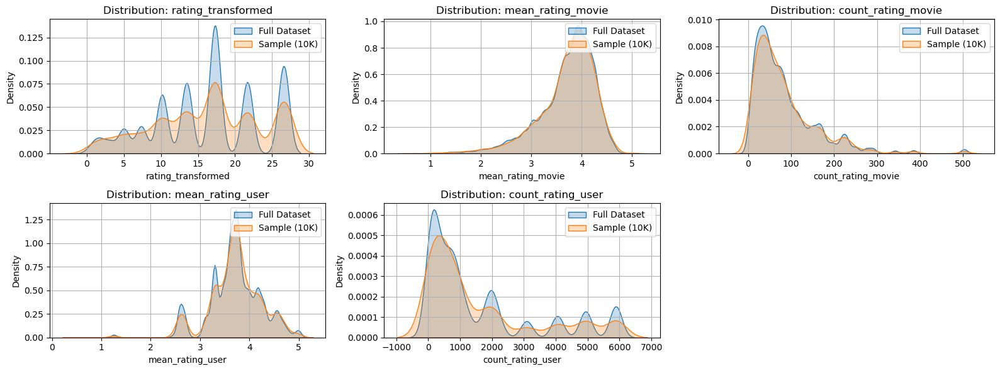

In [175]:
features = ['rating_transformed', 'mean_rating_movie', 'count_rating_movie',  'mean_rating_user', 'count_rating_user']
# Set up subplots
fig, axes = plt.subplots(2, 3, figsize=(16, 6))
axes = axes.flatten()  # Flatten to 1D array

# Plot KDE for each feature
for idx, col in enumerate(features):
    sns.kdeplot(X[col], label='Full Dataset', fill=True, ax=axes[idx])
    sns.kdeplot(X_sample[col], label='Sample (10K)', fill=True, ax=axes[idx])
    axes[idx].set_title(f'Distribution: {col}')
    axes[idx].legend()
    axes[idx].grid(True)

# Remove unused subplot if necessary
if len(features) < len(axes):
    for i in range(len(features), len(axes)):
        fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

The Kernel Density Estimation (KDE) visualizations indicate that the sample distribution closely mirrors that of the full dataset. The sampling was performed to ensure representation across the entire range of feature values, thereby capturing the variability present in the population and enhancing the generalizability of the analysis.

#### Testing 2: Kolmogorov–Smirnov (KS) Test

In [178]:
from scipy.stats import ks_2samp
features = ['rating_transformed', 'mean_rating_movie', 'count_rating_movie',  'mean_rating_user', 'count_rating_user']

# Compare first 5 features
for feature in features:
    stat, p = ks_2samp(X[feature], X_sample[feature])
    print(f"Feature {feature} | KS Statistic = {stat:.4f}, p-value = {p:.4f}")

Feature rating_transformed | KS Statistic = 0.0091, p-value = 0.8245
Feature mean_rating_movie | KS Statistic = 0.0083, p-value = 0.8981
Feature count_rating_movie | KS Statistic = 0.0059, p-value = 0.9963
Feature mean_rating_user | KS Statistic = 0.0210, p-value = 0.0310
Feature count_rating_user | KS Statistic = 0.0085, p-value = 0.8821


The Kolmogorov–Smirnov (KS) test results suggest that the sampled data is statistically similar to the population across most features. Specifically, for rating_transformed, mean_rating_movie, count_rating_movie, and count_rating_user, the high p-values (p > 0.05) indicate no significant difference in distributions between the sample and the full dataset. However, the feature mean_rating_user shows a p-value of 0.0310, which is marginally below the 0.05 threshold, suggesting a slight divergence in its distribution. Nonetheless, the overall alignment supports the representativeness of the sample.

### Testing 3: PCA Visualisation between the X and X_sample


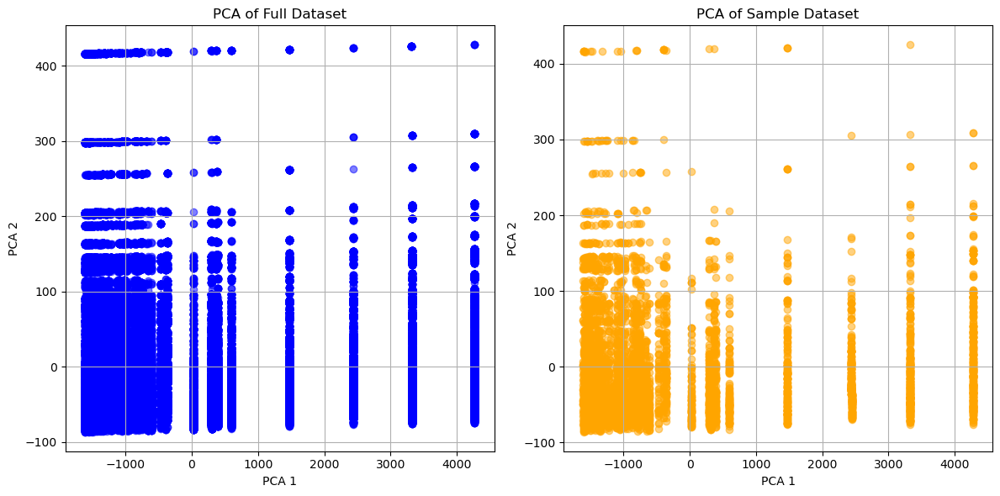

In [181]:
from sklearn.decomposition import PCA

# Reduce to 2D using t-SNE
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X)  # Full dataset
X_sample_pca = pca.fit_transform(X_sample)  # Sample dataset

# Plot the t-SNE projections for full dataset and sample
plt.figure(figsize=(12, 6))

# Plot full dataset t-SNE
plt.subplot(1, 2, 1)
plt.scatter(X_pca[:, 0], X_pca[:, 1], alpha=0.5, color='blue', label='Full Dataset')
plt.title("PCA of Full Dataset")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.grid(True)

# Plot sample dataset t-SNE
plt.subplot(1, 2, 2)
plt.scatter(X_sample_pca[:, 0], X_sample_pca[:, 1], alpha=0.5, color='orange', label='Sample (10K)')
plt.title("PCA of Sample Dataset")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.grid(True)

plt.tight_layout()
plt.show()

### Testing 4: Independent T Test

In [183]:
from scipy.stats import ttest_ind

# List of features to perform t-test on
features = ['rating_transformed', 'mean_rating_movie', 'count_rating_movie',  'mean_rating_user', 'count_rating_user']

# Loop through the features and perform the t-test
for feature in features:
    # Perform t-test between full dataset and sample dataset
    t_stat, p_value = ttest_ind(X[feature], X_sample[feature], equal_var=False)  # unequal variance
    print(f"Feature: {feature}")
    print(f"t-statistic: {t_stat:.4f}, p-value: {p_value:.4f}")
    if p_value < 0.05:
        print(f"  -> The means of {feature} are significantly different between the full dataset and the sample dataset.\n")
    else:
        print(f"  -> The means of {feature} are not significantly different between the full dataset and the sample dataset.\n")


Feature: rating_transformed
t-statistic: -0.6873, p-value: 0.4919
  -> The means of rating_transformed are not significantly different between the full dataset and the sample dataset.

Feature: mean_rating_movie
t-statistic: 0.0076, p-value: 0.9939
  -> The means of mean_rating_movie are not significantly different between the full dataset and the sample dataset.

Feature: count_rating_movie
t-statistic: -0.2338, p-value: 0.8152
  -> The means of count_rating_movie are not significantly different between the full dataset and the sample dataset.

Feature: mean_rating_user
t-statistic: -0.8832, p-value: 0.3772
  -> The means of mean_rating_user are not significantly different between the full dataset and the sample dataset.

Feature: count_rating_user
t-statistic: 0.2057, p-value: 0.8370
  -> The means of count_rating_user are not significantly different between the full dataset and the sample dataset.



The Independent t-tests indicate that there are no statistically significant differences in the means of the selected features between the full dataset and the sample dataset. All p-values exceed the common significance threshold (p > 0.05), suggesting that the sample accurately reflects the population in terms of central tendency for features such as rating_transformed, mean_rating_movie, count_rating_movie, mean_rating_user, and count_rating_user.

###  Scaling and Normalizing

In [186]:
from sklearn.preprocessing import normalize
from sklearn.preprocessing import StandardScaler


# Scaling the dense features (leaving the one-hot coding)

dense_features = X_sample[['rating_transformed', 'mean_rating_user', 'count_rating_user', 
                     'mean_rating_movie', 'count_rating_movie']]

genre_ohe = X_sample.select_dtypes("int32")

scaler = StandardScaler()
dense_scaled  = scaler.fit_transform(dense_features)

# Step 2: Concatenate all features
from numpy import hstack
X_combined = hstack([dense_scaled, genre_ohe.values])

# Normalising using L1 Normalising
X_normalized_l1 = normalize(X_combined, norm='l1', axis=1)


### Creating a dataframe with the normalized values

In [188]:
column_names = list(dense_features.columns) + list(genre_ohe.columns)
X_normalized_df = pd.DataFrame(X_normalized_l1, columns=column_names)


### Kmeans clustering on the L1 normaized

In [190]:
### PCA for visualisation
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_normalized_l1)


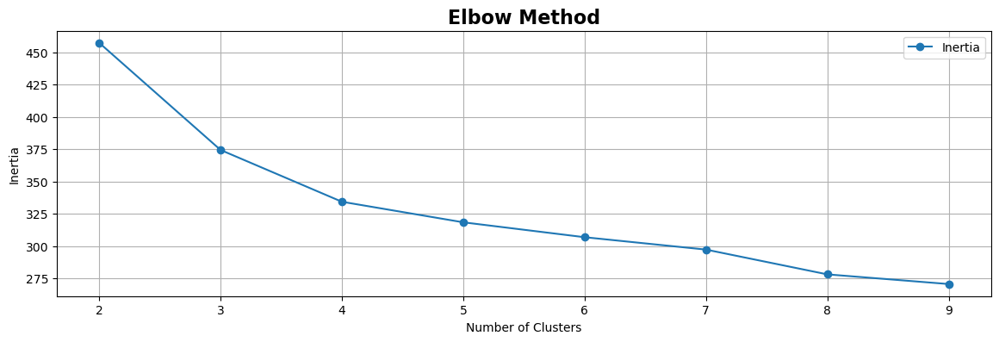

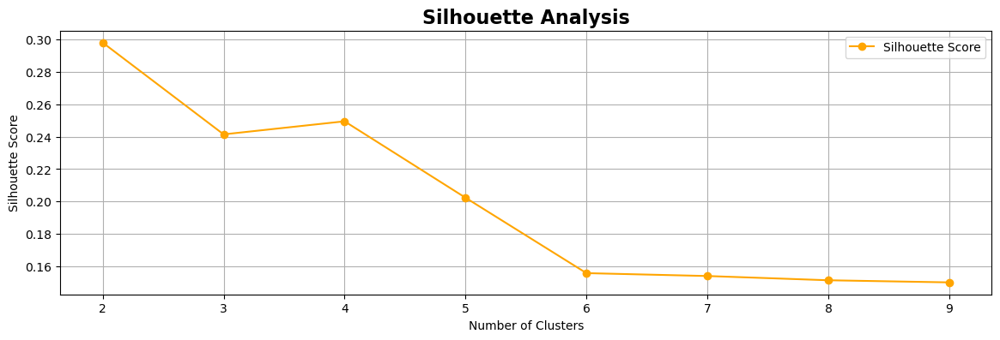

In [191]:
# Run KMeans
inertia_values = []
silhouette_scores = []

# different numbers of clusters
for n_clusters in range(2, 10):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42).fit(X_normalized_l1)
    inertia_values.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_normalized_l1, kmeans.labels_))

# Plot the Elbow Method
plt.figure(figsize=(14,4))
plt.plot(range(2, 10), inertia_values, marker='o', label='Inertia')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method',  fontsize=16, weight="bold")
plt.legend()
plt.grid(True)
plt.show()

# Plot the Silhouette Scores
plt.figure(figsize=(14,4))
plt.plot(range(2, 10), silhouette_scores, marker='o', color='orange', label='Silhouette Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis',  fontsize=16, weight="bold")
plt.legend()
plt.grid(True)
plt.show()

In [192]:
pca = PCA(n_components=2, random_state=42)
X_sample_pca= pca.fit_transform(X_normalized_l1)


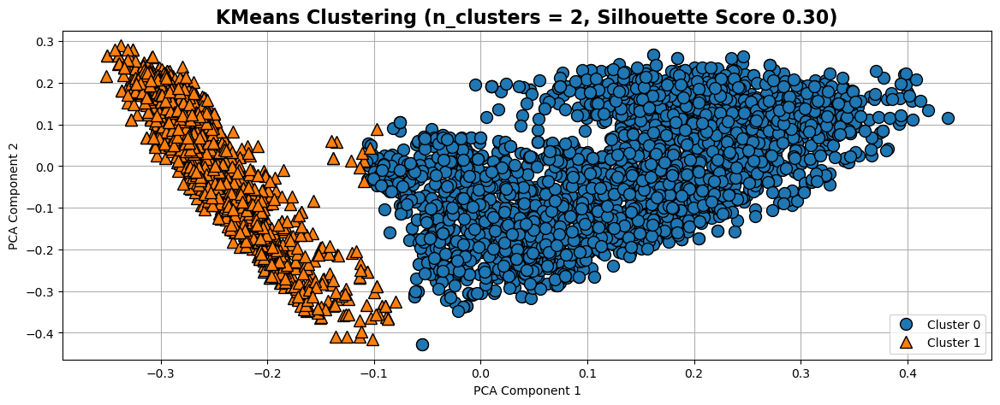

In [193]:
import mglearn

# Perform KMeans clustering
y_pred_normalized = KMeans(n_clusters=2, random_state=42).fit_predict(X_normalized_l1)
sil_score = silhouette_score(X_normalized_l1, y_pred_normalized)
X_sample['kmeans_normalized_2'] = y_pred_normalized

# Plot the clusters
plt.figure(figsize=(14, 5))
mglearn.discrete_scatter(X_sample_pca[:, 0], X_sample_pca[:, 1], y_pred_normalized)

# Set correct cluster labels based on actual prediction order
plt.legend(["Cluster 0", "Cluster 1"], loc='lower right')

plt.title(f"KMeans Clustering (n_clusters = 2, Silhouette Score {sil_score:.2f})", fontsize=16, weight="bold")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.grid(True)
plt.show()

#### Conclsuion:
When KMeans was applied to the sample dataset, both the elbow method and silhouette analysis (0.30) indicated that two clusters provided the optimal solution. Although a clear separation between the clusters was observed, the silhouette score was lower compared to the baseline model applied earlier. This suggests that the current preprocessing pipeline may have reduced the effectiveness of the clustering performance.

### K-Medoids Clustering
KMedoids is more robust to noise and outliers. But unlike KMeans, K-Medoids selects actual data points (medoids) as cluster centers, making it less sensitive to extreme values. It workd better with L1 distances. K-Medoids can use any distance metric, including Manhattan (L1), which aligns with the current preprocessing. K-Medoids can adapt better than KMeans with sparse or categorical-like structure

k = 2, Silhouette Score = 0.2825
k = 3, Silhouette Score = 0.2164
k = 4, Silhouette Score = 0.1768
k = 5, Silhouette Score = 0.1265
k = 6, Silhouette Score = 0.1069
k = 7, Silhouette Score = 0.1055
k = 8, Silhouette Score = 0.1156
k = 9, Silhouette Score = 0.1281
k = 10, Silhouette Score = 0.1075


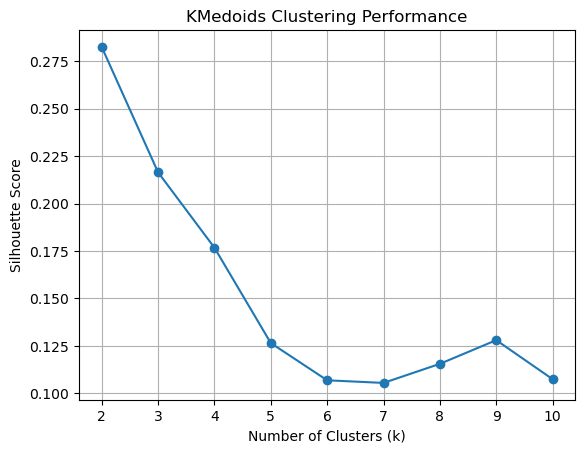

In [201]:
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import silhouette_score

scores = []
k_values = range(2, 11)  # Trying k from 2 to 10

for k in k_values:
    kmedoids = KMedoids(n_clusters=k, metric='euclidean', random_state=42)
    kmedoids.fit(X_normalized_l1)
    labels = kmedoids.labels_
    
    if len(np.unique(labels)) > 1:
        score = silhouette_score(X_normalized_l1, labels)
    else:
        score = -1  # Invalid silhouette if only one cluster is formed
    
    scores.append(score)
    print(f"k = {k}, Silhouette Score = {score:.4f}")

# Plotting the results
plt.plot(k_values, scores, marker='o')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("KMedoids Clustering Performance")
plt.grid(True)
plt.show()


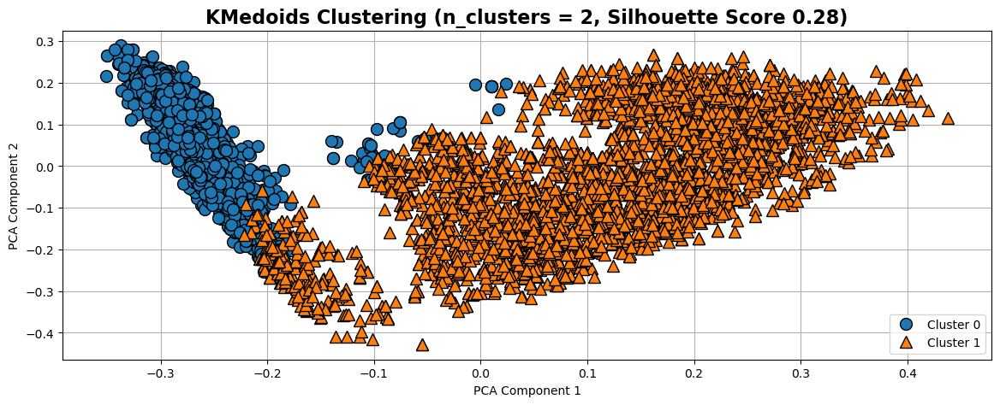

In [205]:
import mglearn

# Perform KMeans clustering
y_pred_kmedoids = KMedoids(n_clusters=2, random_state=42).fit_predict(X_normalized_l1)
sil_score = silhouette_score(X_normalized_l1, y_pred_kmedoids)

# Plot the clusters
plt.figure(figsize=(14, 5))
mglearn.discrete_scatter(X_sample_pca[:, 0], X_sample_pca[:, 1], y_pred_kmedoids)

# Set correct cluster labels based on actual prediction order
plt.legend(["Cluster 0", "Cluster 1"], loc='lower right')

plt.title(f"KMedoids Clustering (n_clusters = 2, Silhouette Score {sil_score:.2f})", fontsize=16, weight="bold")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.grid(True)
plt.show()

### Conclusion:
With KMedoids clustering, k = 2 gives the highest silhouette score, indicating the most distinct separation of clusters. This suggests that the data may naturally split into two groups when using KMedoids with the Euclidean distance. Increasing k further decreases cluster quality, which can mean the additional clusters are overlapping or fragmenting the space without improving cohesion. The plot shows clearly that there is overapping of the two clusters and the model struggles in separating the classess properly.

### Next Step: DBSCAN on the Scaled and L1 Normalized data

### DBSCAN clustering on the L1 normalized

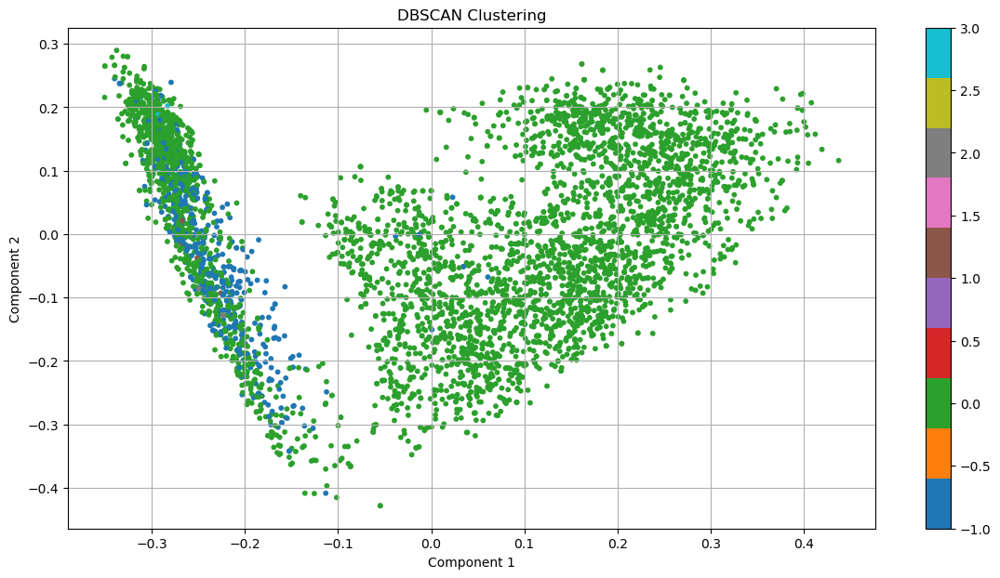

Estimated clusters: 4
Noise points: 454
Silhouette Score for DBSCAN: 0.05057084227350065


In [209]:
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, OPTICS

dbscan = DBSCAN(eps=0.2, min_samples=5)
dbscan.fit(X_normalized_l1)  # <- This is essential

# Now labels_ exists
labels = dbscan.labels_

# Plot
plt.figure(figsize=(14, 7))
plt.scatter(X_sample_pca[:, 0], X_sample_pca[:, 1], c=labels, cmap='tab10', s=10)
plt.title('DBSCAN Clustering')
plt.colorbar()

plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.grid(True)
plt.show()

#  print summary
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = list(labels).count(-1)
print(f"Estimated clusters: {n_clusters}")
print(f"Noise points: {n_noise}")

from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(X_normalized_l1, dbscan.labels_)
print(f"Silhouette Score for DBSCAN: {silhouette_avg}")

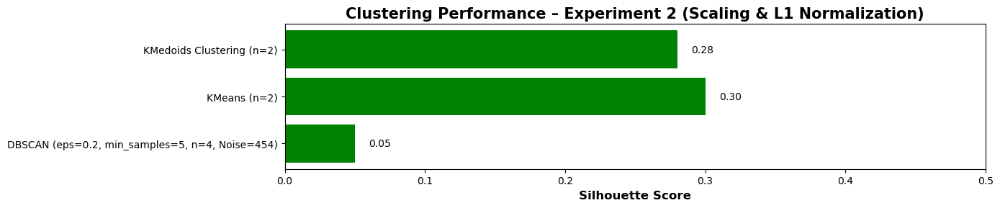

In [217]:
# Methods and silhouette scores
methods = [
    "DBSCAN (eps=0.2, min_samples=5, n=4, Noise=454)",
    "KMeans (n=2)",
    "KMedoids Clustering (n=2)"
]
silhouette_scores = [
    0.05,  # DBSCAN
    0.30,     # KMeans
    0.28 # KMedoids
]

# Plot setup
plt.figure(figsize=(14, 3))
bars = plt.barh(methods, silhouette_scores, color='green')

# Add text labels with silhouette score and cluster info
for i, bar in enumerate(bars):
    width = bar.get_width()
    plt.text(width + 0.01, bar.get_y() + bar.get_height() / 2,
             f"{silhouette_scores[i]:.2f}",
             va='center', fontsize=10)

# Labels and formatting
plt.xlabel("Silhouette Score", fontsize=12, weight="bold")
plt.title("Clustering Performance – Experiment 2 (Scaling & L1 Normalization)", fontsize=15, weight="bold")
plt.xlim(0, 0.5)
plt.axvline(0, color='gray', linestyle='--')
plt.tight_layout()
plt.show()

### Conclusion:
In Experiment 2, after applying feature scaling and L1 normalization, DBSCAN was able to form 4 clusters with 453 noise points, resulting in a silhouette score of 0.09. This is a significant change from the previous experiment, where DBSCAN over-fragmented the dataset due to unscaled and sparse features. Although the silhouette score remains low, it indicates that normalization helped DBSCAN detect a more coherent structure with fewer clusters and less noise. However, the quality of clustering is still weak, suggesting that further parameter tuning (especially eps) is needed.

On the other hand, KMeans (n=2) achieved a silhouette score of 0.30, showing better overall separation than DBSCAN in this setting. While the score is not very high, it suggests moderate clustering performance, and KMeans appears more robust after normalization. 

KMedoids clustering, k = 2 gives the highest silhouette score, indicating the most distinct separation of clusters. Increasing k further decreases cluster quality, which can mean the additional clusters are overlapping or fragmenting the space without improving cohesion. 

These results reinforce the importance of scaling and support further experimentation with different cluster sizes and distance metrics.